<a href="https://colab.research.google.com/github/V-Meenakshi/HousePricePrediction/blob/main/advanced_house_price_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Advanced house price prediction**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
import warnings
warnings.filterwarnings('ignore')
#this is optional import used to ignore the unnecessary warnings

In [ ]:
df = pd.read_csv("/content/train.csv")
# importing the data set and creating data frames

In [ ]:
df.head() #prints the first 5 rows
# df.tail() #prints the last 5 rows
#these are used to just check that all columns are imported

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
df.shape

(1460, 81)

In [ ]:
df.columns #all the column names i.e features

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [ ]:
#checking the duplicates for the rows
df.duplicated().sum()

0

In [ ]:
#checking the null values columnwise
df.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [ ]:
null_count = df.isnull().sum()
feature_with_null = null_count[null_count > 0].index
#.index gives the column of the not null values
print(feature_with_null)

Index(['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')


In [ ]:
null_counts = df[['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature']].isnull().sum()
print(null_counts)

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


In [ ]:
#droping the col more than 1000 null values
#axis = 1 is colwise and axis = 0 is rowwise
df = df.drop(['Alley', 'PoolQC', 'Fence', 'MiscFeature'], axis = 1)

NameError: ignored

In [ ]:
#the numerical data is filled with the mean
numeric_features = ['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
for feature in numeric_features:
  df[feature].fillna(df[feature].mean(), inplace = True)

#where the categorical data will be filled with mode
categorical_feature = ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']
for feature in categorical_feature:
  df[feature].fillna(df[feature].mode()[0], inplace = True)

In [ ]:
df.isnull().sum()
#now if we observe ther are 77 features we droped 4 features
#but in case of more features

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 77, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [ ]:
# we can drop id also as this is not important for the calculations
df = df.drop('Id', axis = 1)

In [ ]:
df.describe()
#this will describe only the numerical data

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,22.024023,9981.264932,1.382997,1.112799,30.202904,20.645407,180.569112,456.098091,161.319273,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,70.049958,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [ ]:
#select_dtypesdf.describe()
#this will describe only the numerical data - to select the dtype of certain and then we can create list using tolist()
object_col = df.select_dtypes(include = 'object').columns.tolist()
numeric_col = df.select_dtypes(include = ['int', 'float']).columns.tolist()
print("object columns : ", object_col)
print("numeric columns : ", numeric_col)

object columns :  ['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
numeric columns :  ['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'Enclos

In [ ]:
df.nunique()

MSSubClass         15
MSZoning            5
LotFrontage       111
LotArea          1073
Street              2
                 ... 
MoSold             12
YrSold              5
SaleType            9
SaleCondition       6
SalePrice         663
Length: 76, dtype: int64

**UNIVARIANT ANALYSIS FOR OBJECT TYPE**

In [ ]:
#this will return the unique value in the object-col
for i in object_col:
  print(i, "\n", df[i].unique())
  print()

MSZoning 
 ['RL' 'RM' 'C (all)' 'FV' 'RH']

Street 
 ['Pave' 'Grvl']

LotShape 
 ['Reg' 'IR1' 'IR2' 'IR3']

LandContour 
 ['Lvl' 'Bnk' 'Low' 'HLS']

Utilities 
 ['AllPub' 'NoSeWa']

LotConfig 
 ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']

LandSlope 
 ['Gtl' 'Mod' 'Sev']

Neighborhood 
 ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']

Condition1 
 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']

Condition2 
 ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']

BldgType 
 ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']

HouseStyle 
 ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']

RoofStyle 
 ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']

RoofMatl 
 ['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'Roll'
 'ClyTile']

Exterior1st 
 ['

In [ ]:
for i in object_col:
  print(i, "\n", df[i].value_counts())
  print('\n')

MSZoning 
 RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64


Street 
 Pave    1454
Grvl       6
Name: Street, dtype: int64


LotShape 
 Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64


LandContour 
 Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64


Utilities 
 AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64


LotConfig 
 Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64


LandSlope 
 Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64


Neighborhood 
 NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker  

counter plot :  MSZoning


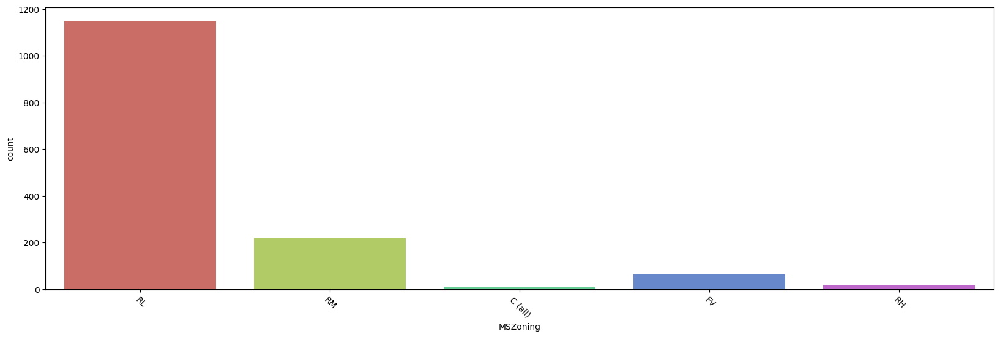



counter plot :  Street


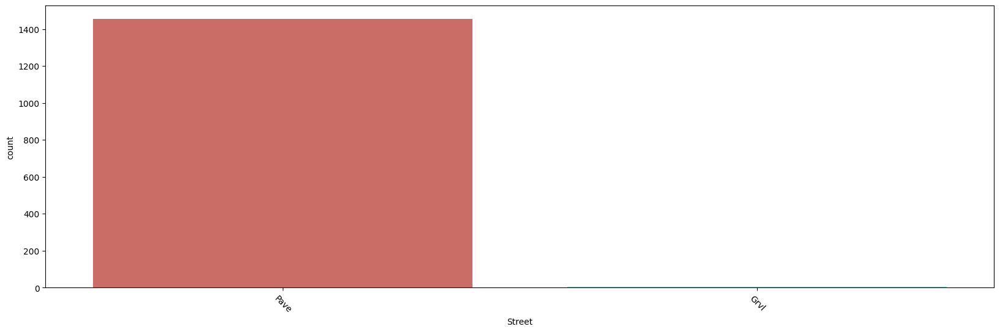



counter plot :  LotShape


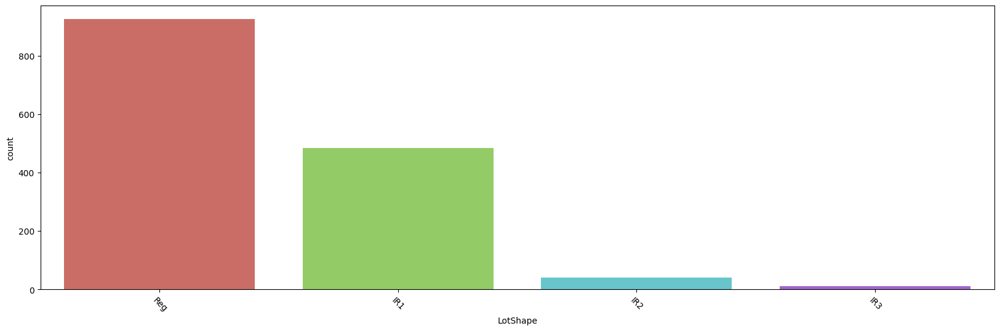



counter plot :  LandContour


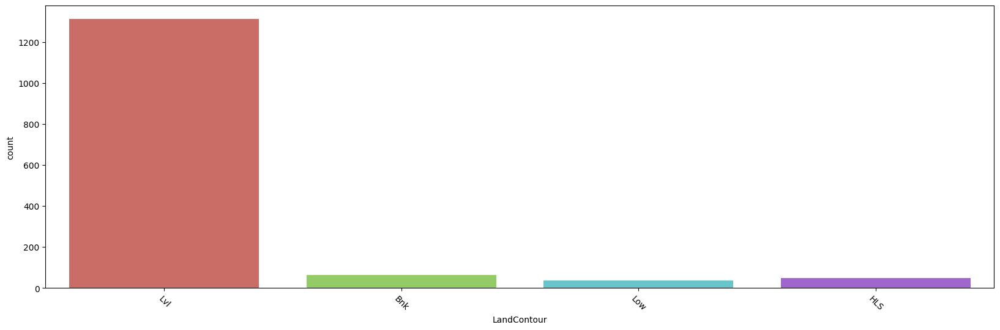



counter plot :  Utilities


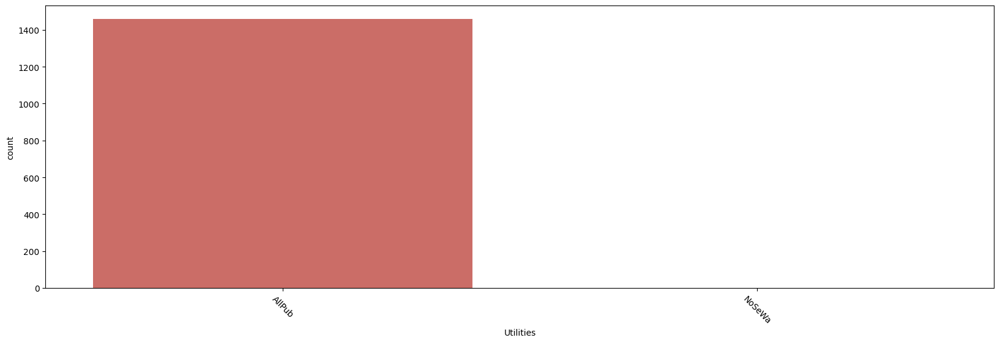



counter plot :  LotConfig


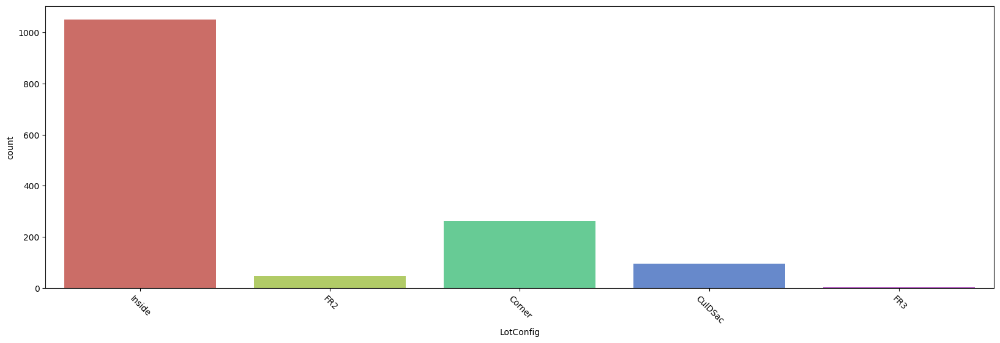



counter plot :  LandSlope


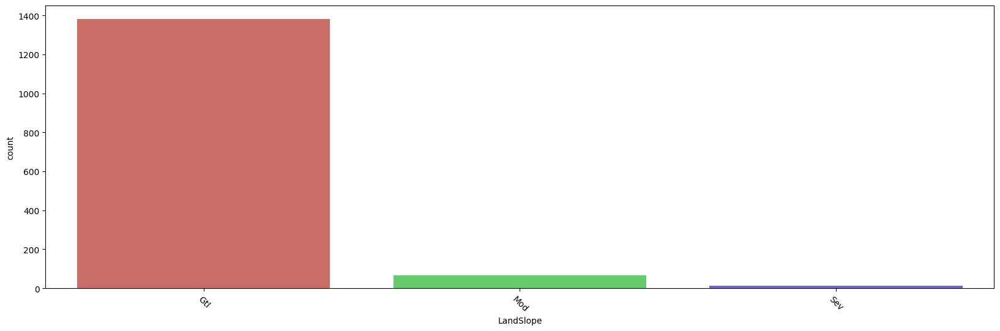



counter plot :  Neighborhood


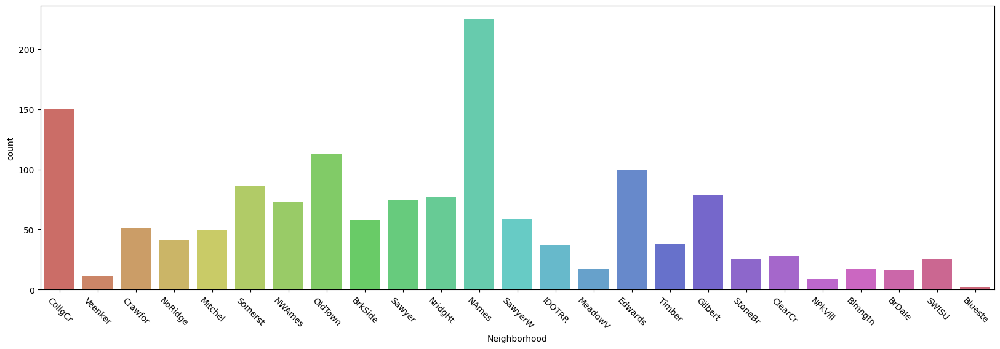



counter plot :  Condition1


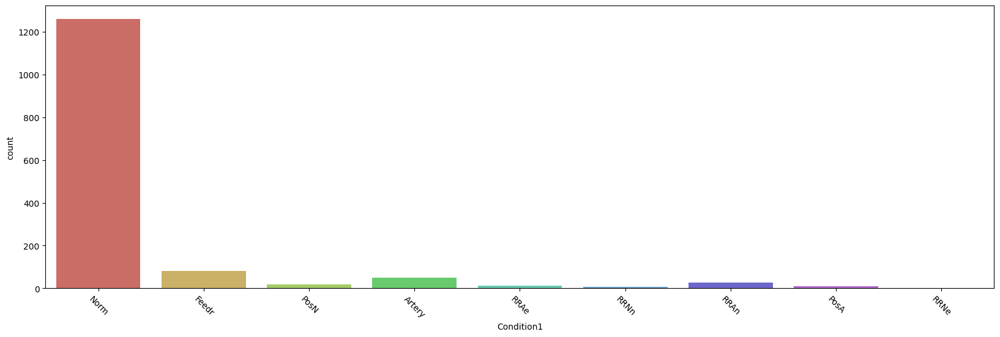



counter plot :  Condition2


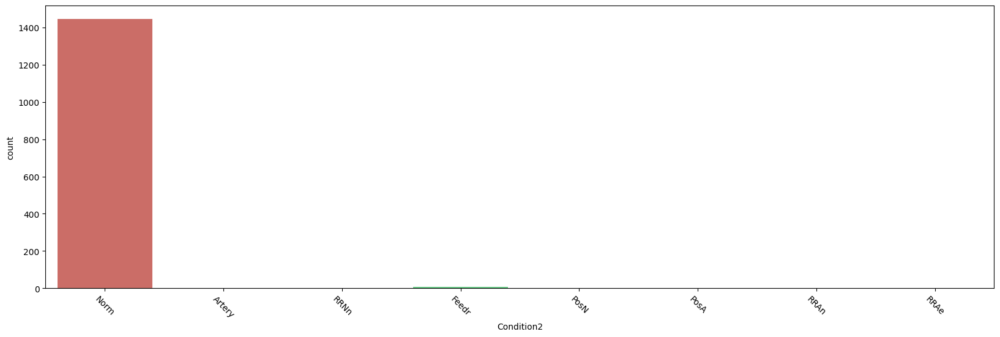



counter plot :  BldgType


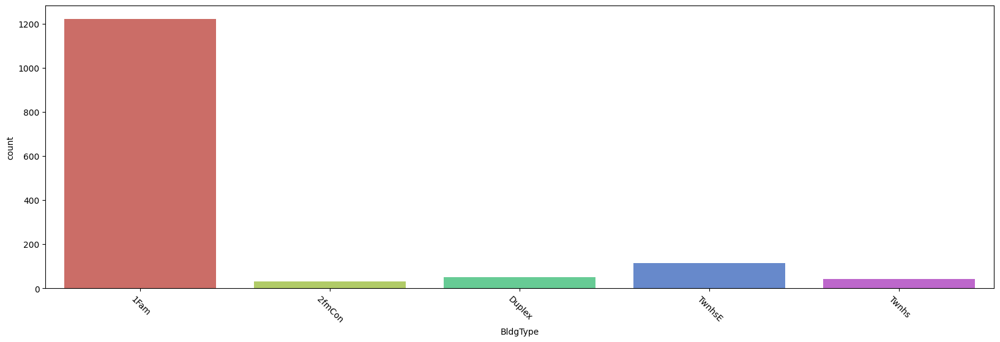



counter plot :  HouseStyle


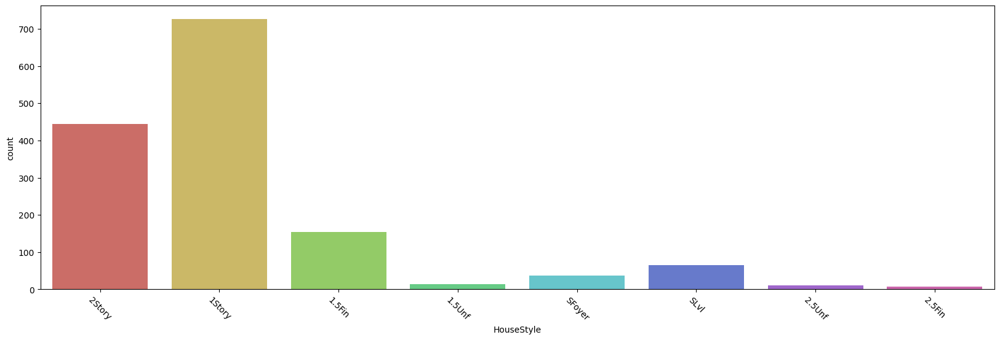



counter plot :  RoofStyle


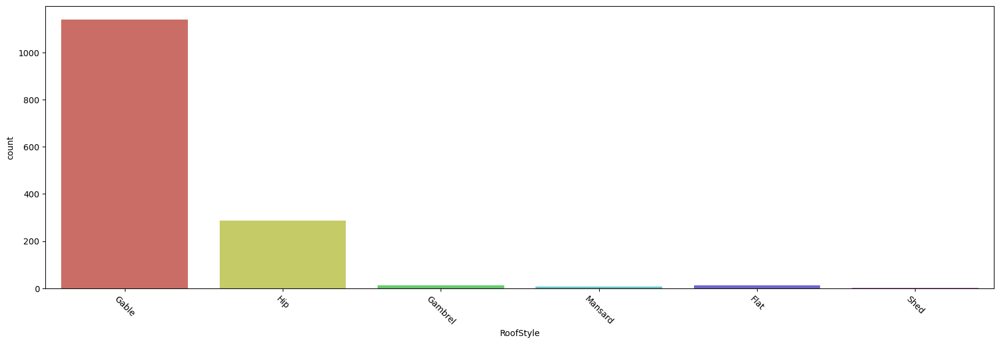



counter plot :  RoofMatl


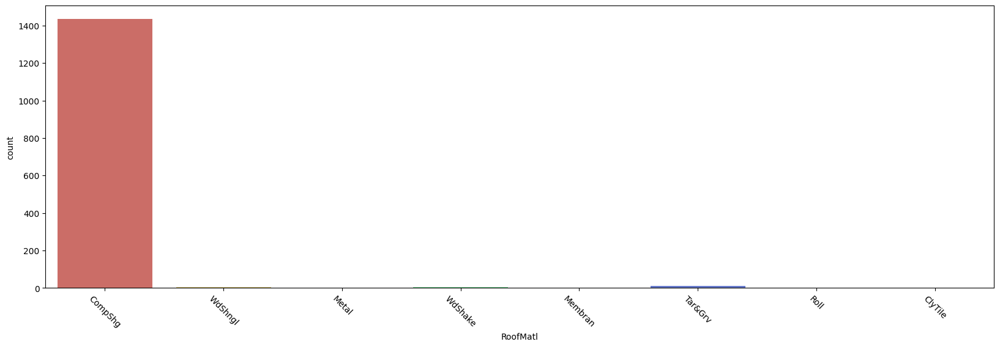



counter plot :  Exterior1st


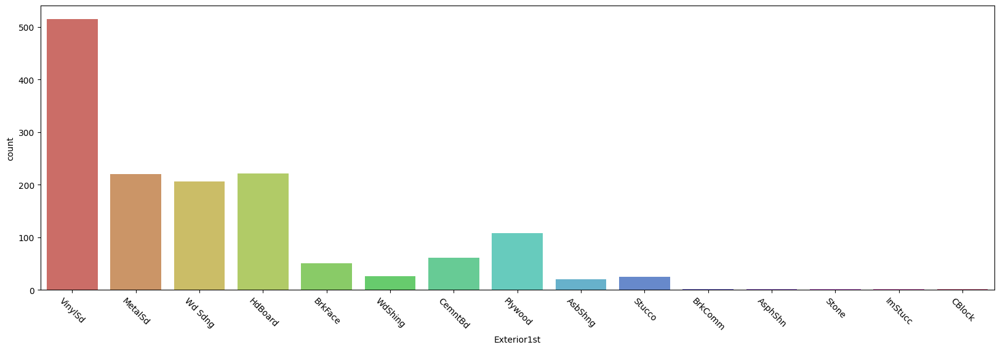



counter plot :  Exterior2nd


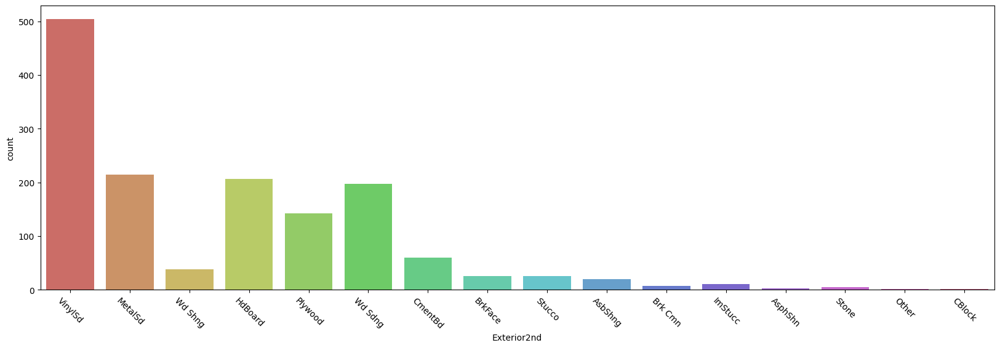



counter plot :  MasVnrType


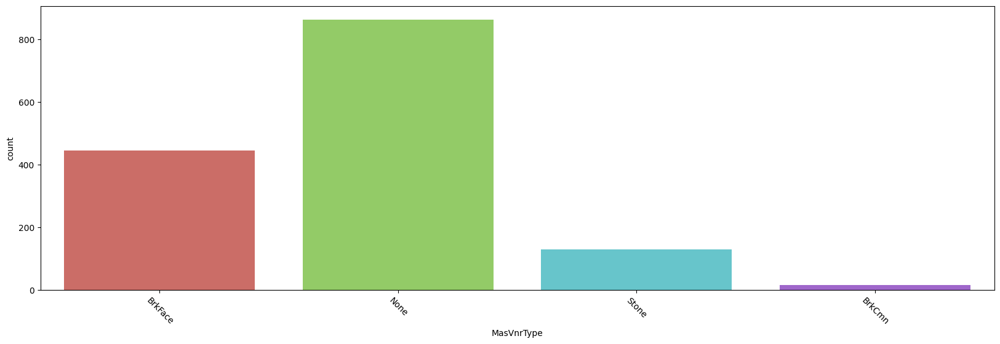



counter plot :  ExterQual


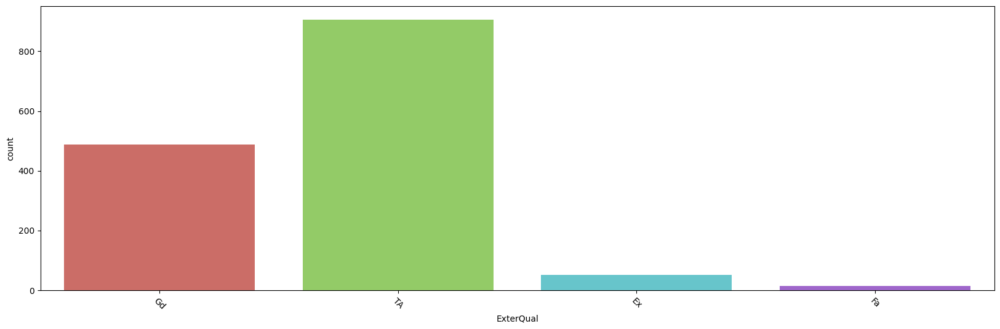



counter plot :  ExterCond


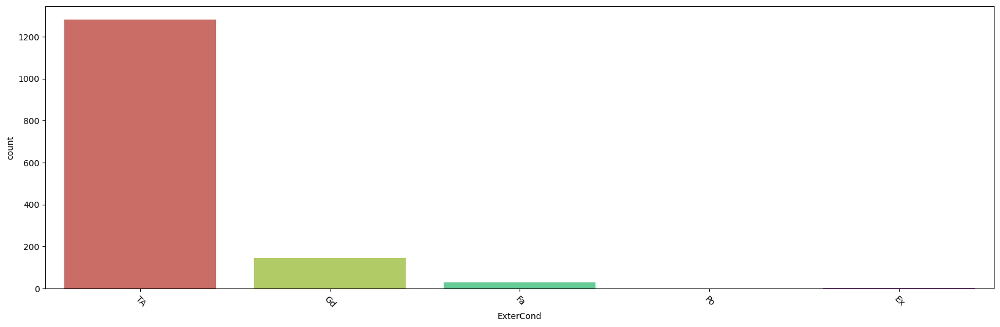



counter plot :  Foundation


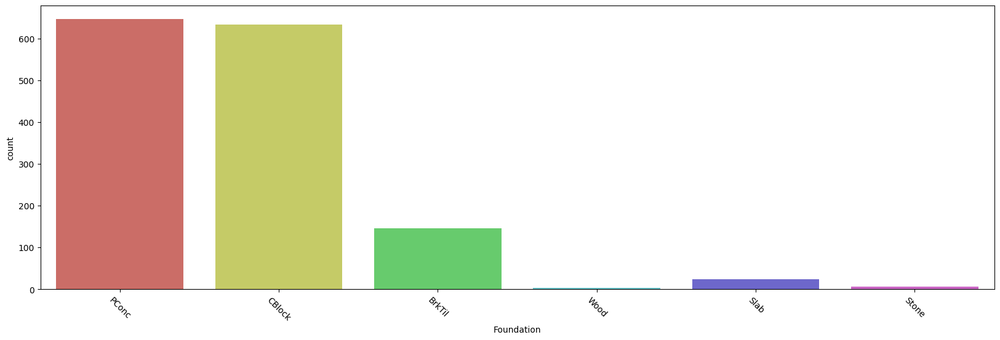



counter plot :  BsmtQual


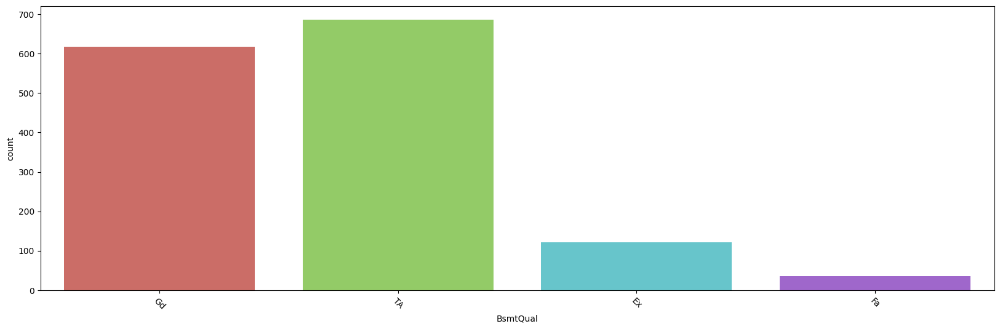



counter plot :  BsmtCond


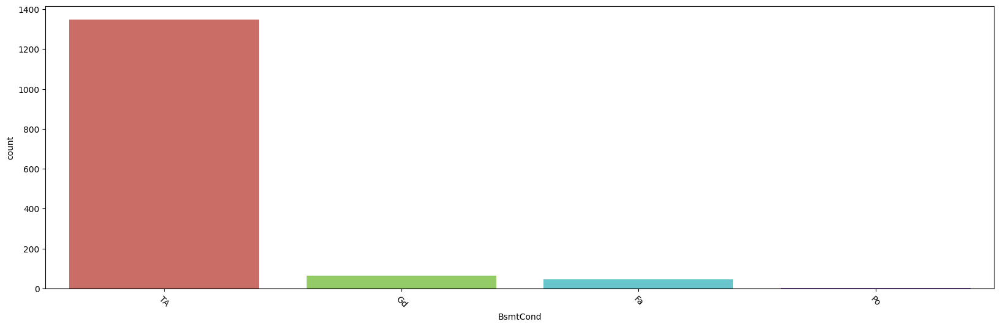



counter plot :  BsmtExposure


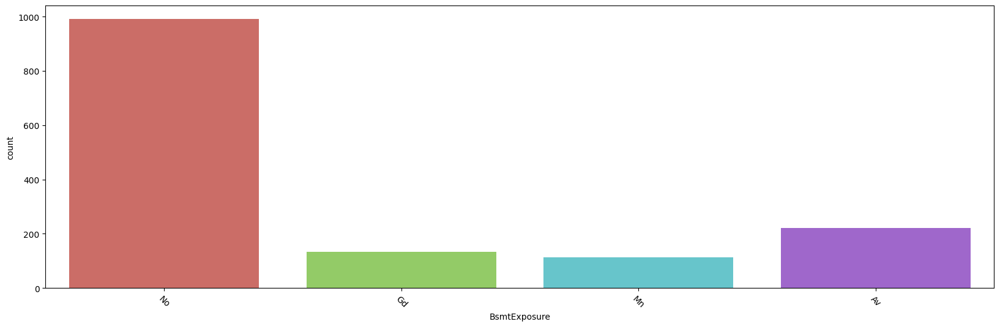



counter plot :  BsmtFinType1


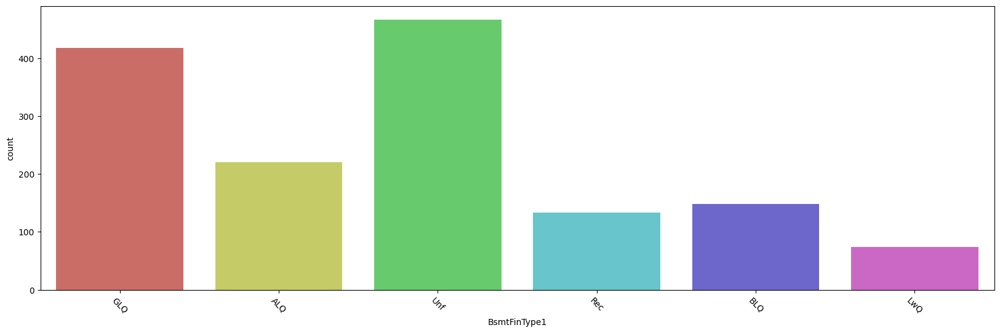



counter plot :  BsmtFinType2


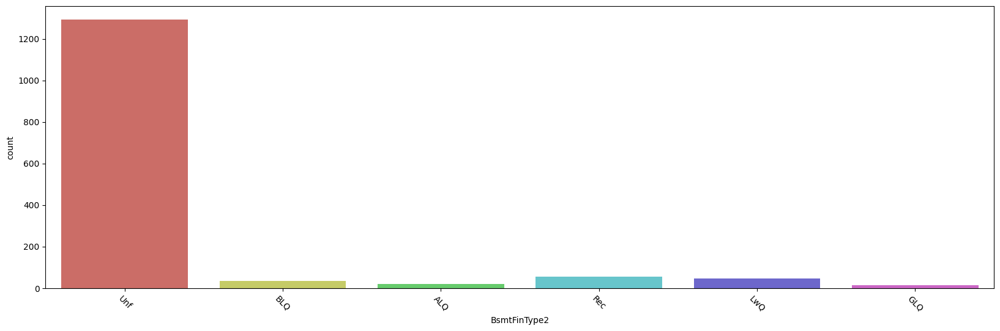



counter plot :  Heating


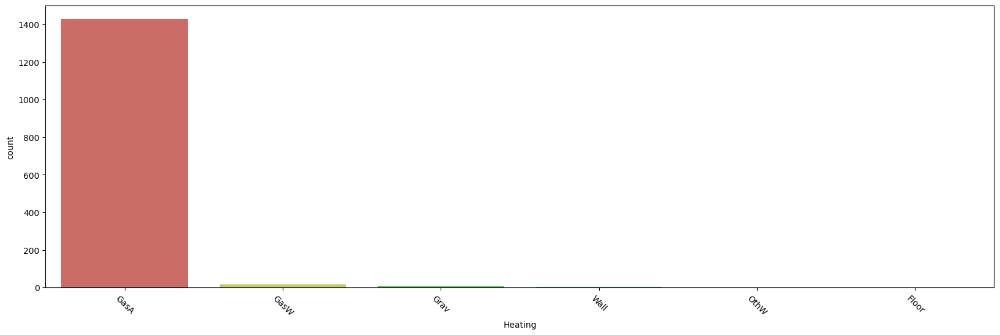



counter plot :  HeatingQC


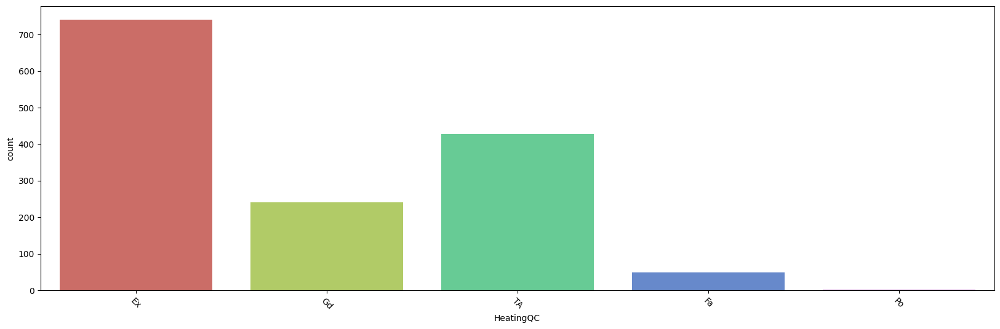



counter plot :  CentralAir


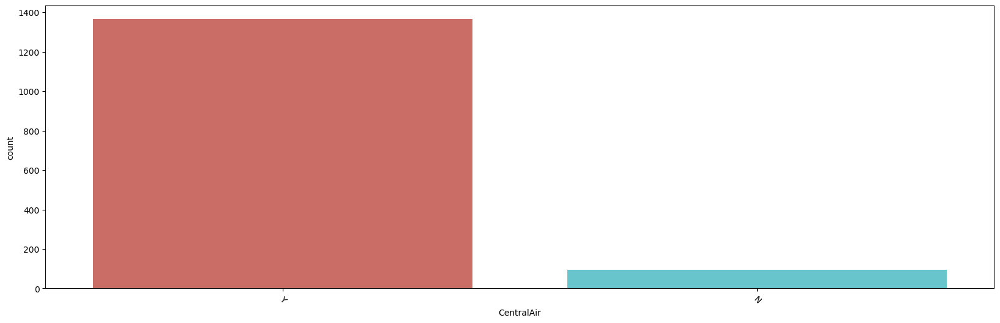



counter plot :  Electrical


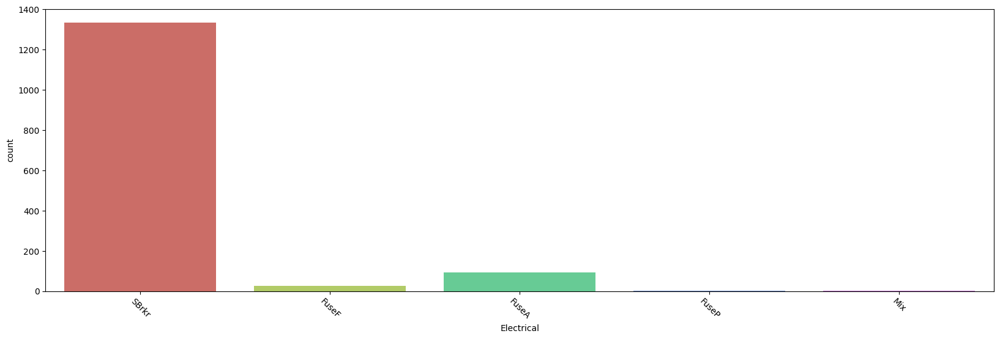



counter plot :  KitchenQual


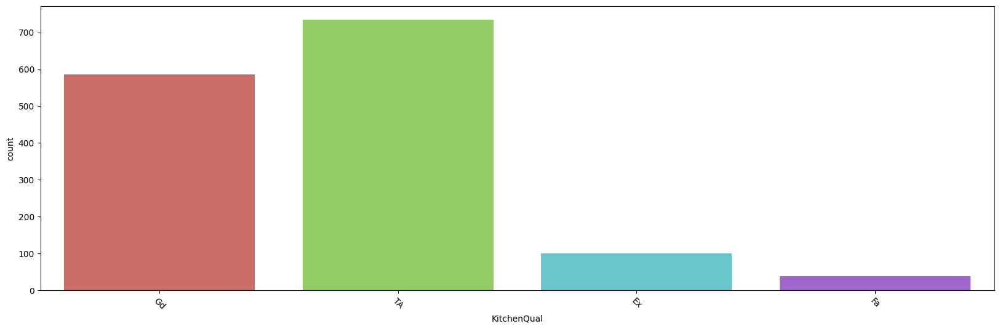



counter plot :  Functional


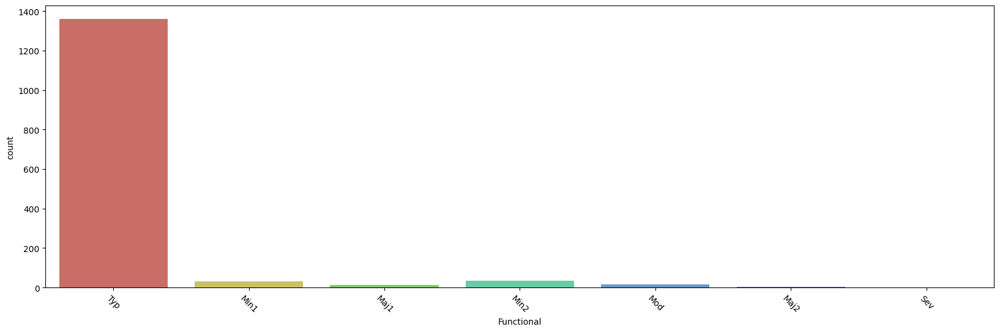



counter plot :  FireplaceQu


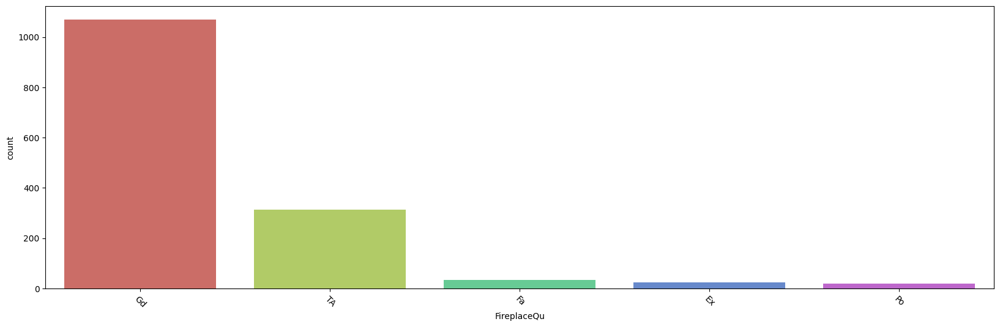



counter plot :  GarageType


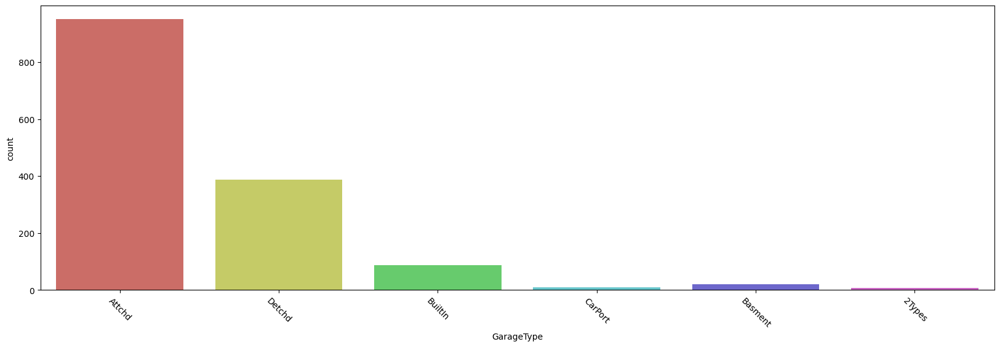



counter plot :  GarageFinish


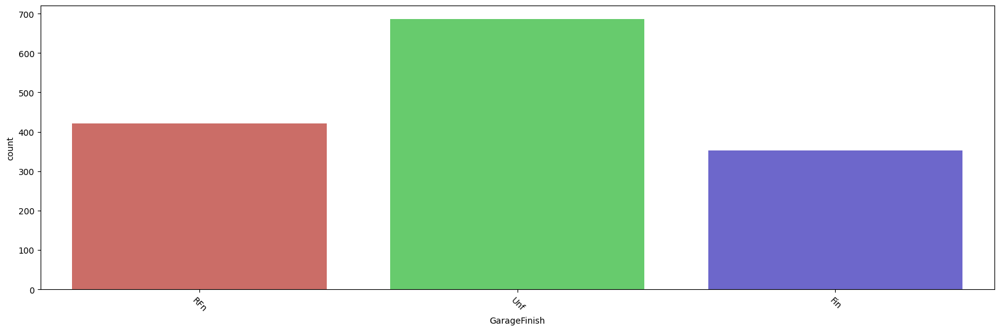



counter plot :  GarageQual


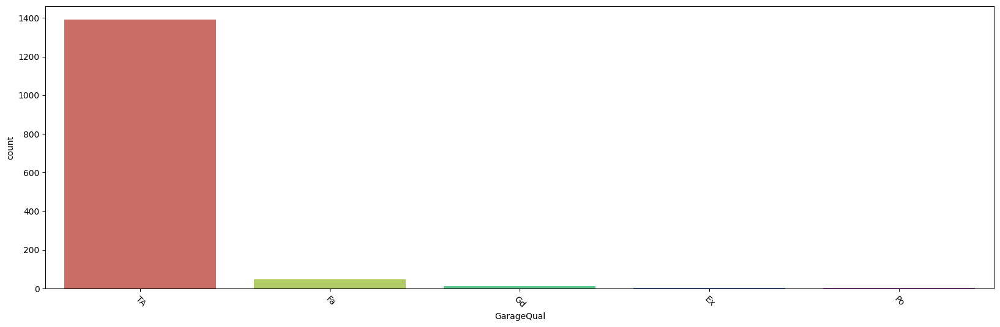



counter plot :  GarageCond


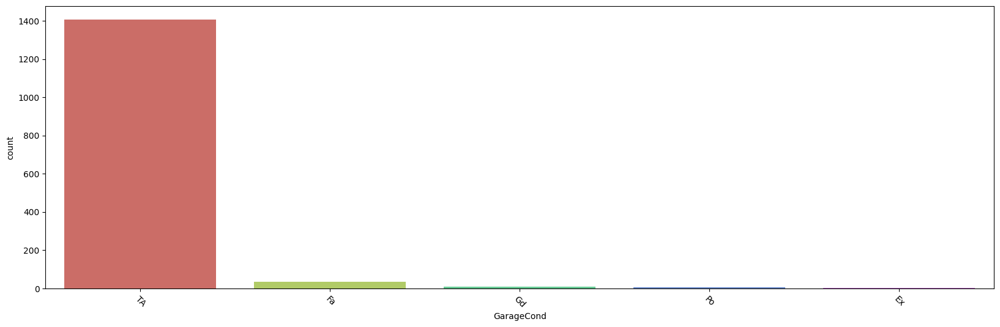



counter plot :  PavedDrive


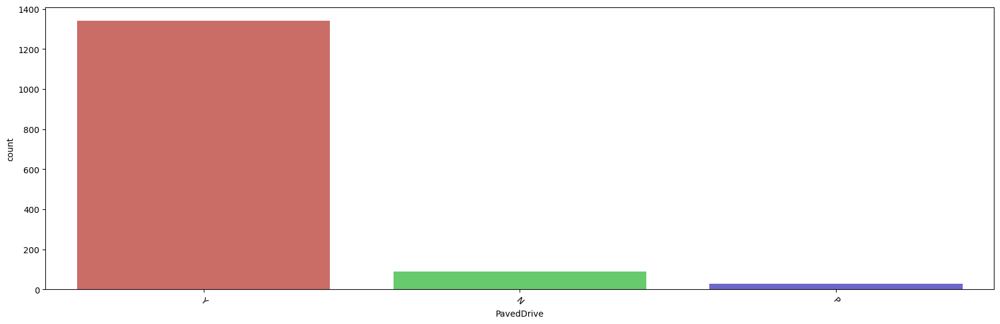



counter plot :  SaleType


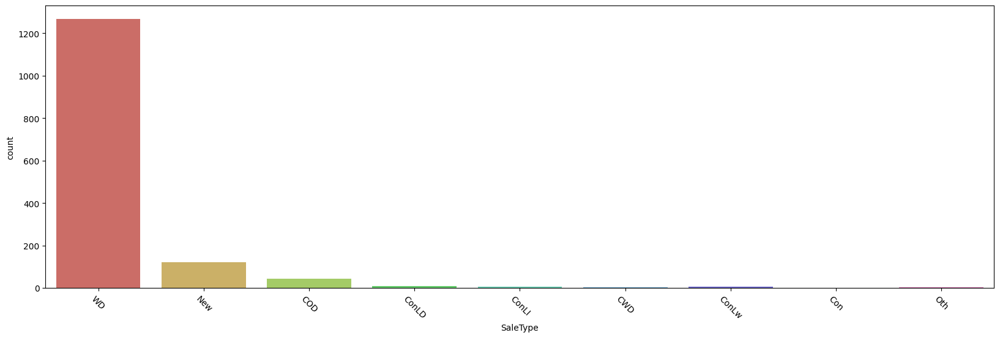



counter plot :  SaleCondition


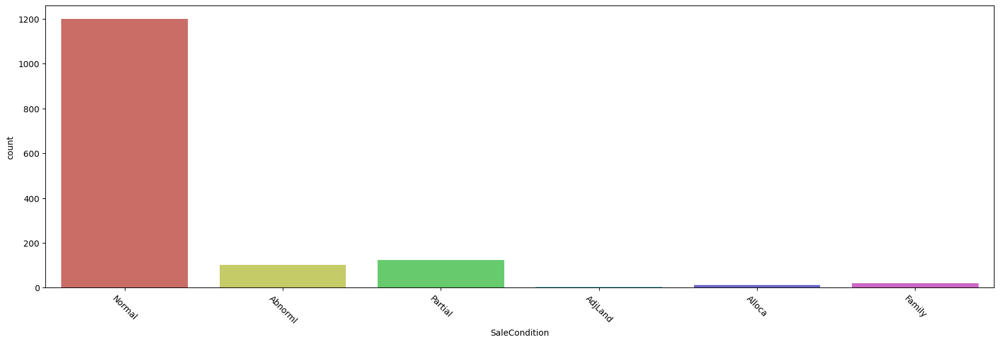

In [ ]:
#xticks - marks on the x axis
#palette - color
for i in object_col:
  print('counter plot : ', i)
  plt.figure(figsize = (20, 6))
  sns.countplot(x = df[i], data = df, palette = 'hls')
  plt.xticks(rotation = -45)
  plt.show()
  print('\n')

Pie plot for :  MSZoning


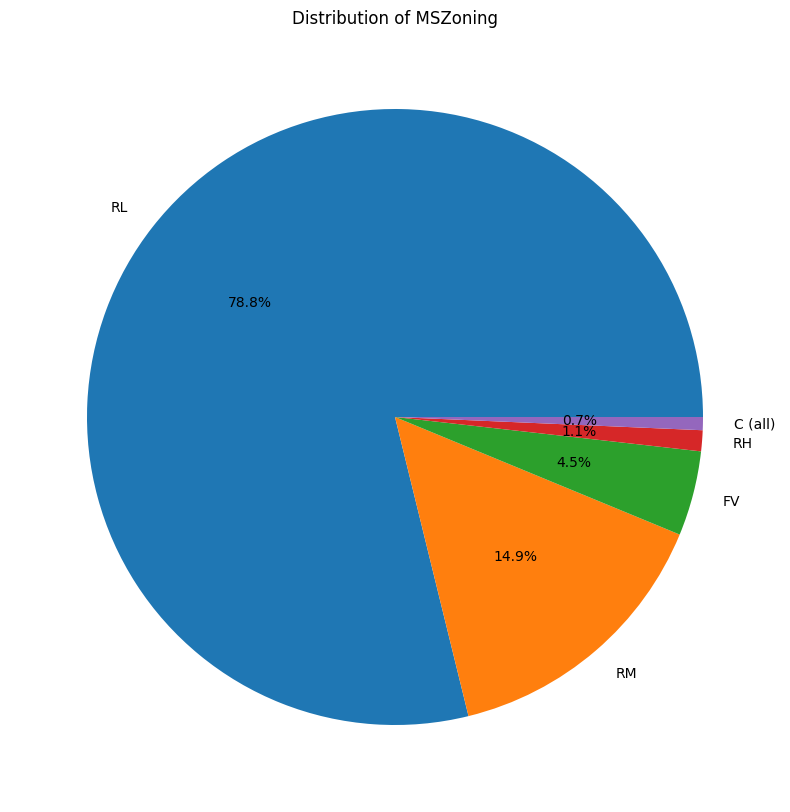



Pie plot for :  Street


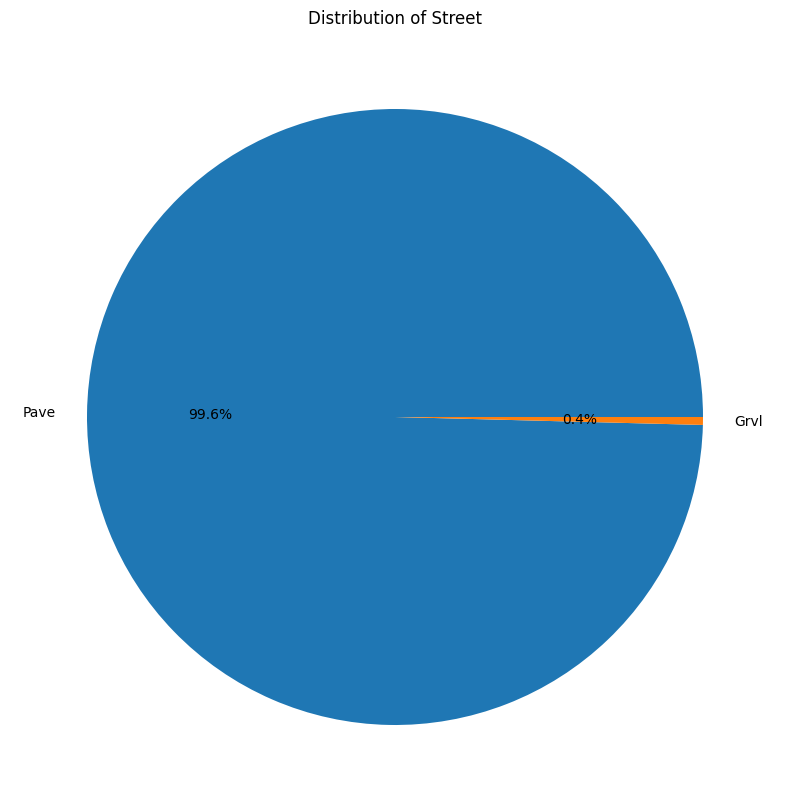



Pie plot for :  LotShape


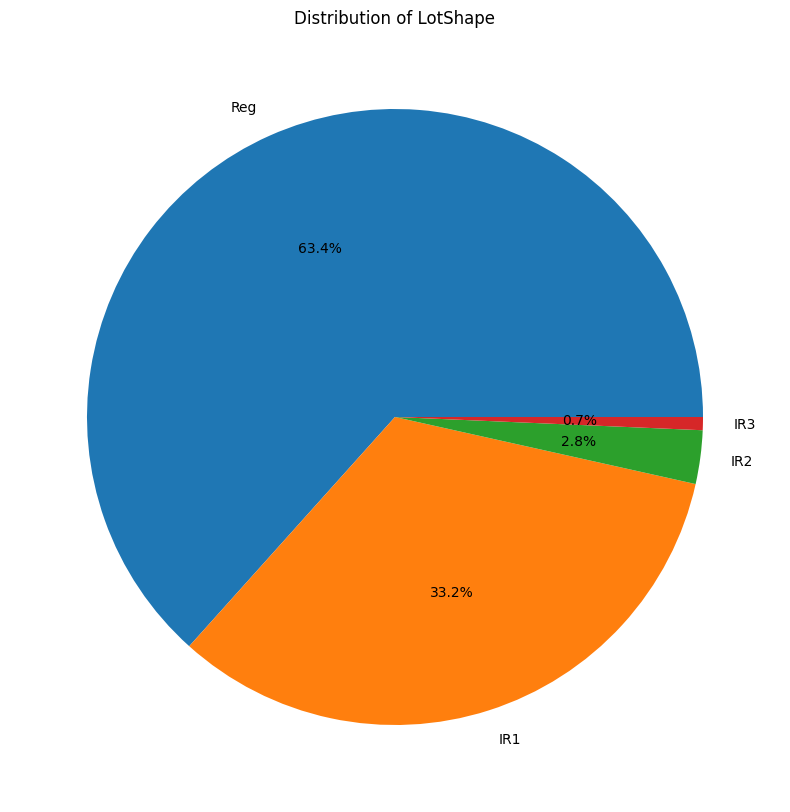



Pie plot for :  LandContour


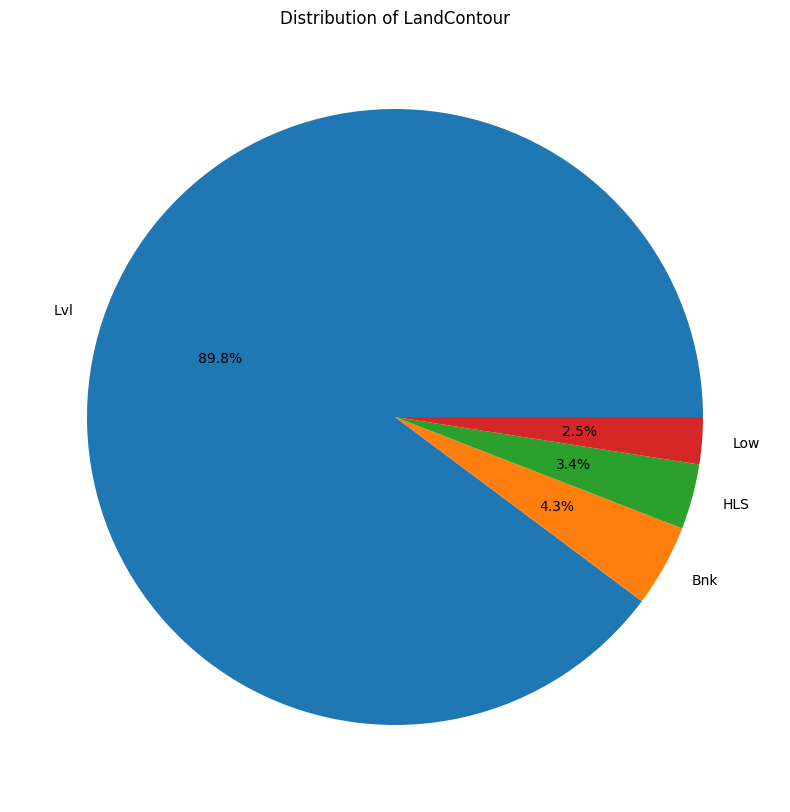



Pie plot for :  Utilities


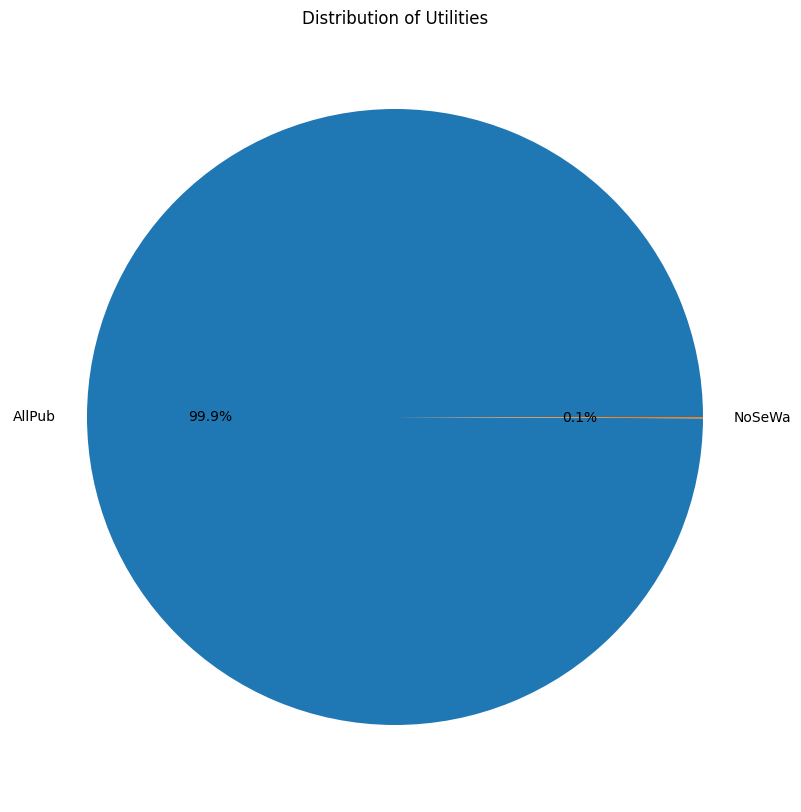



Pie plot for :  LotConfig


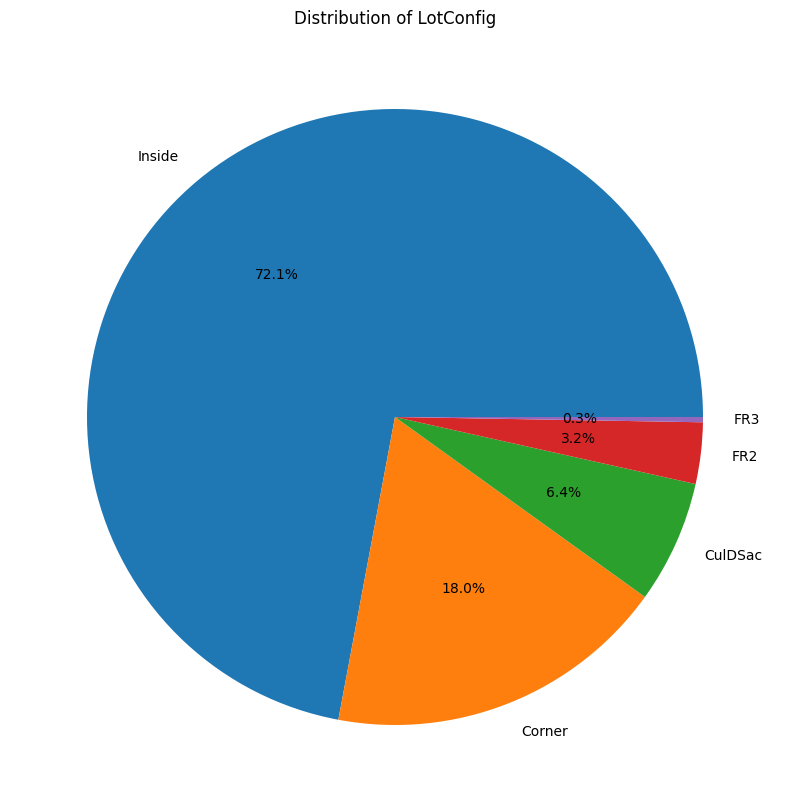



Pie plot for :  LandSlope


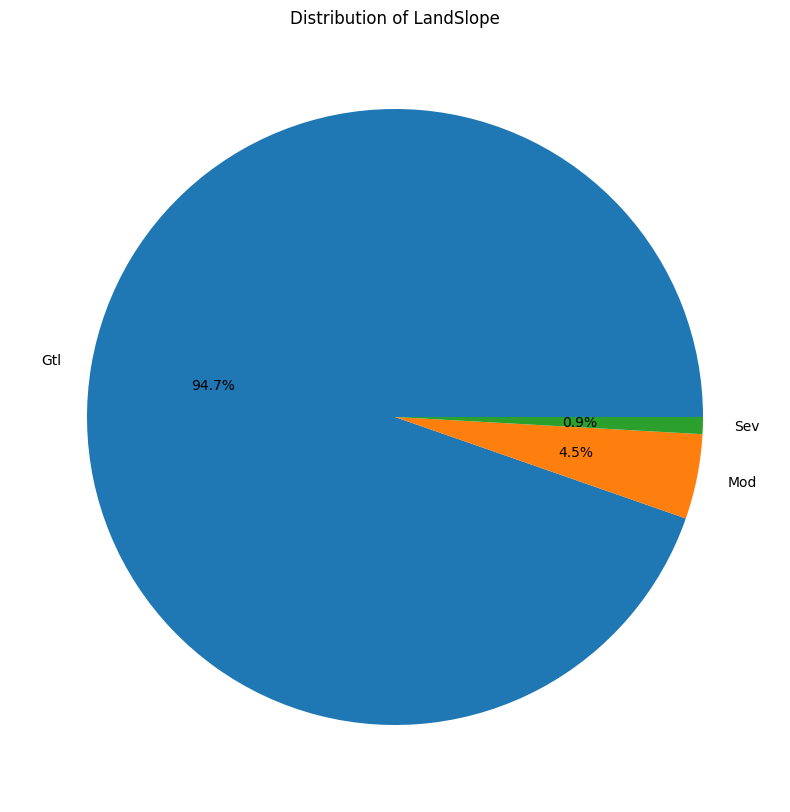



Pie plot for :  Neighborhood


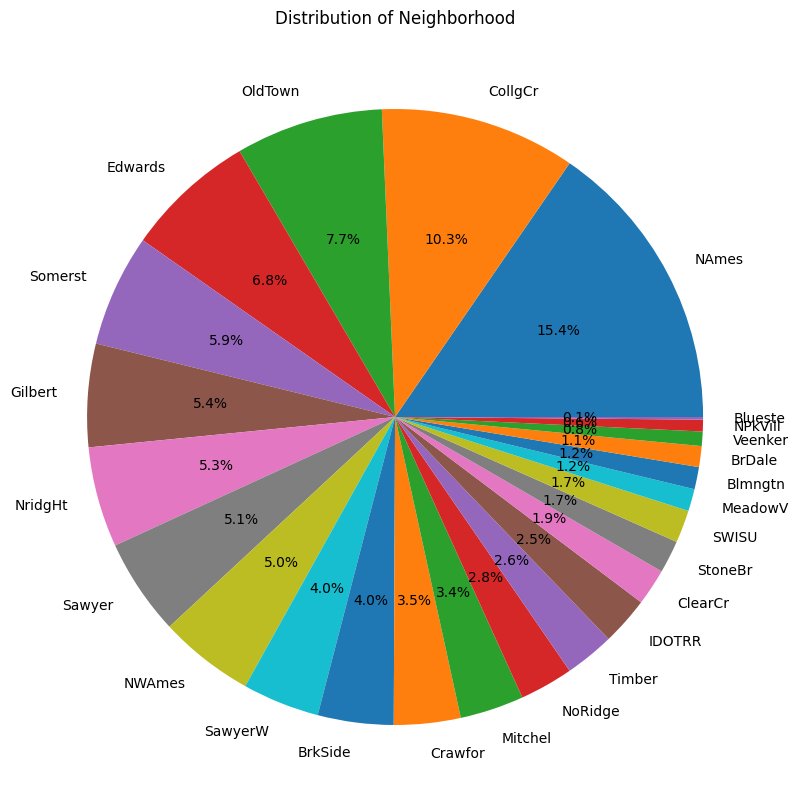



Pie plot for :  Condition1


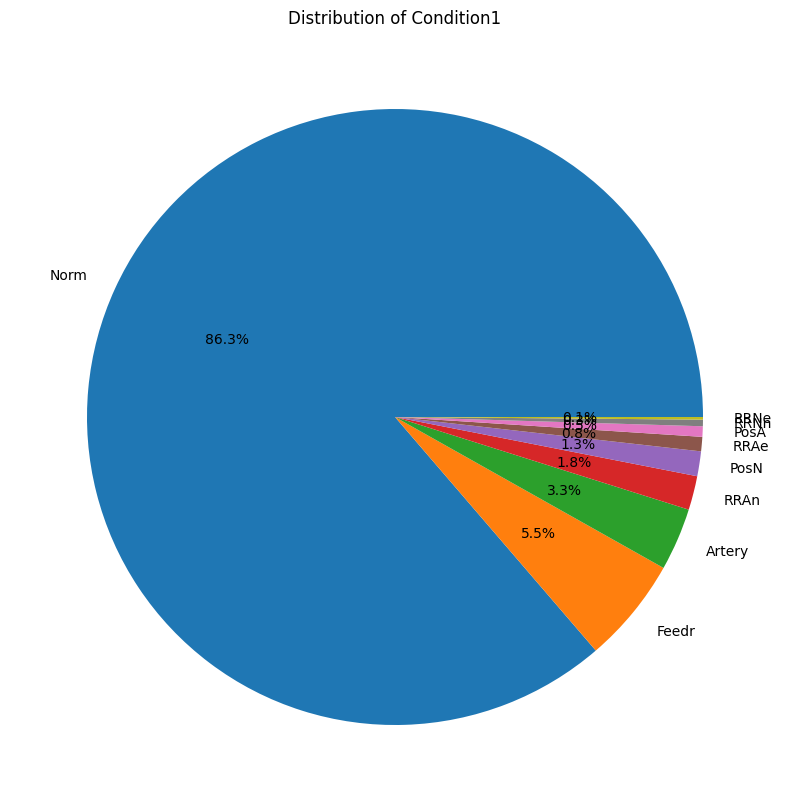



Pie plot for :  Condition2


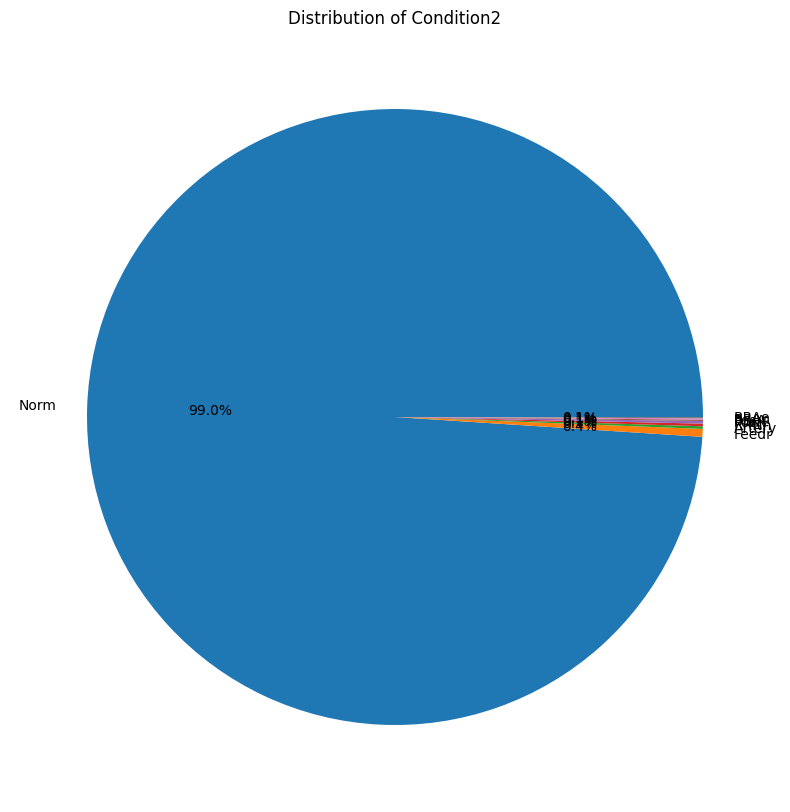



Pie plot for :  BldgType


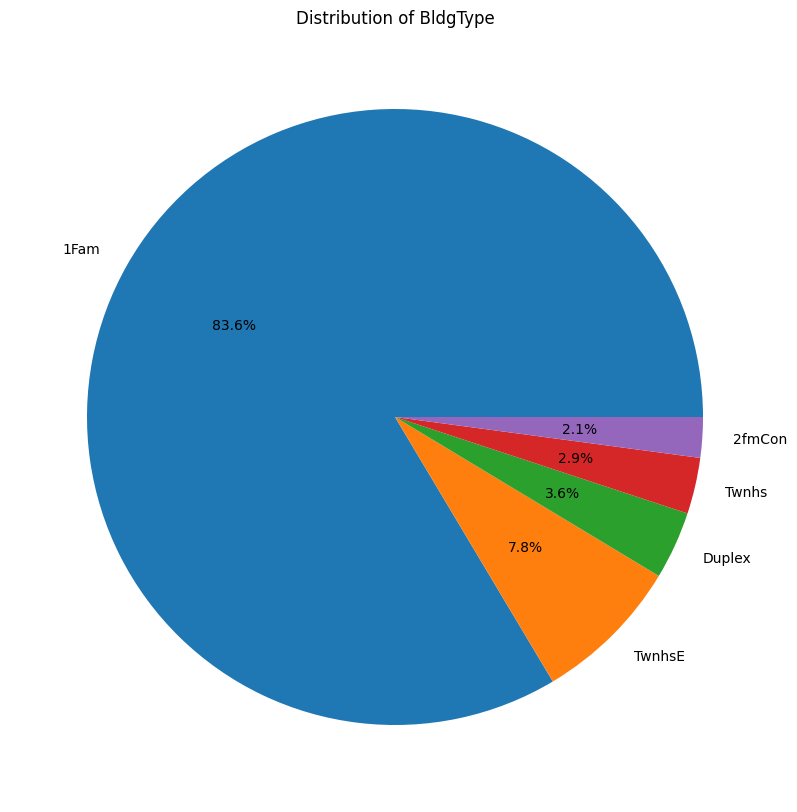



Pie plot for :  HouseStyle


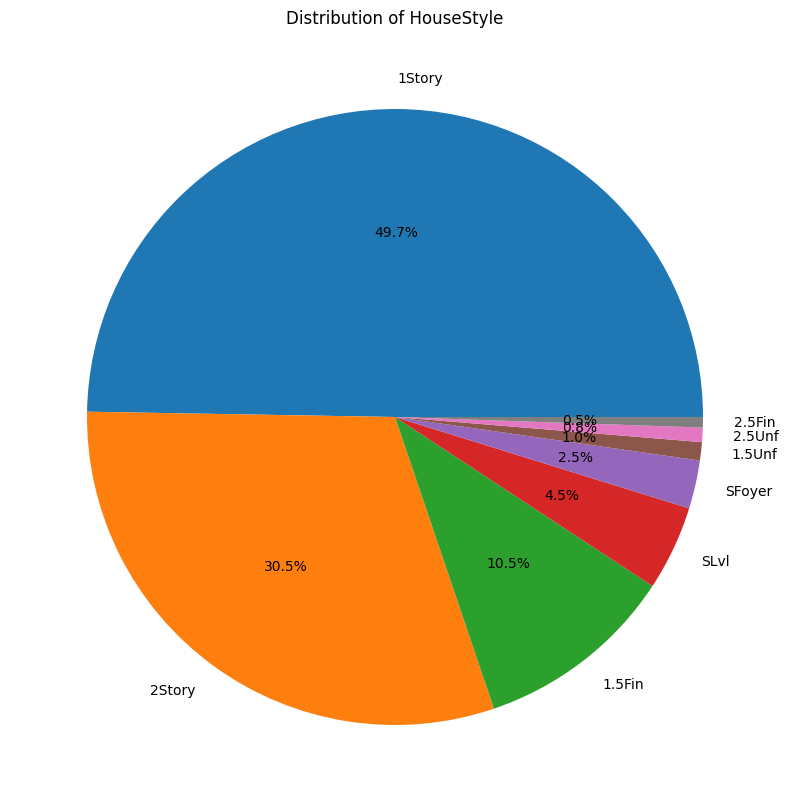



Pie plot for :  RoofStyle


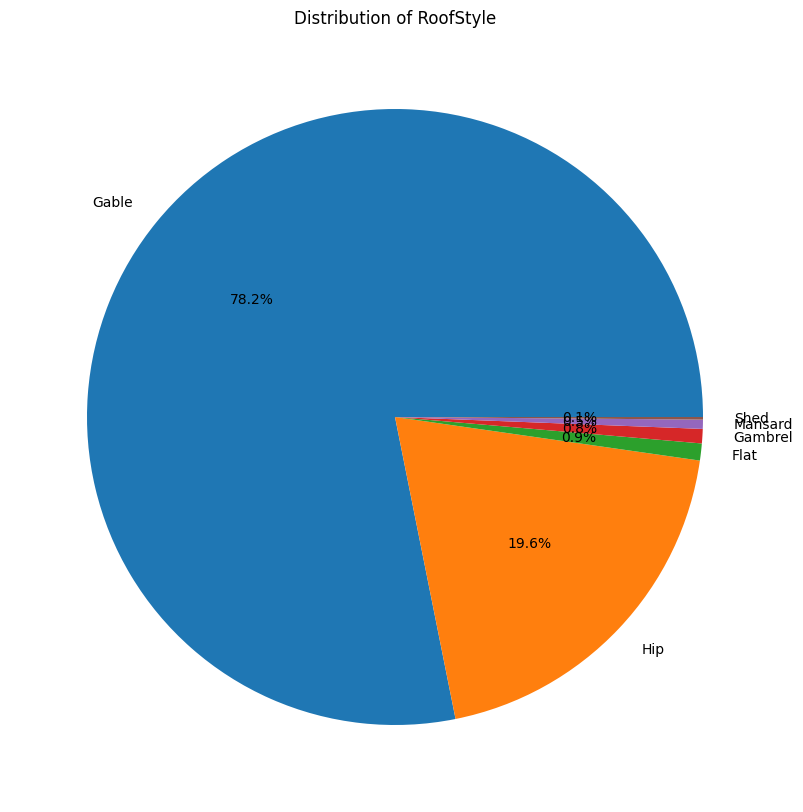



Pie plot for :  RoofMatl


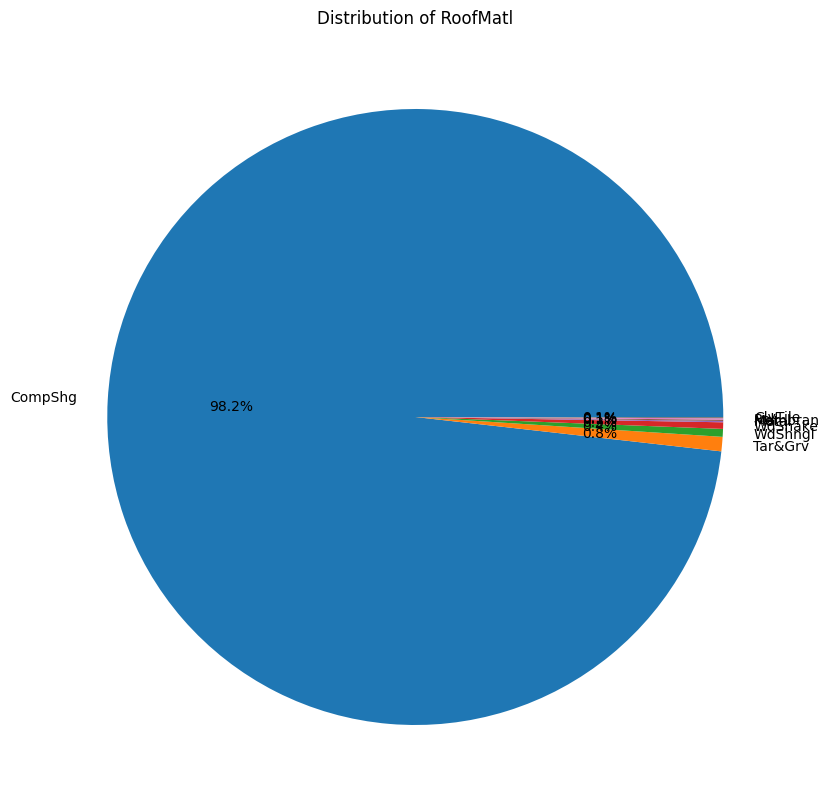



Pie plot for :  Exterior1st


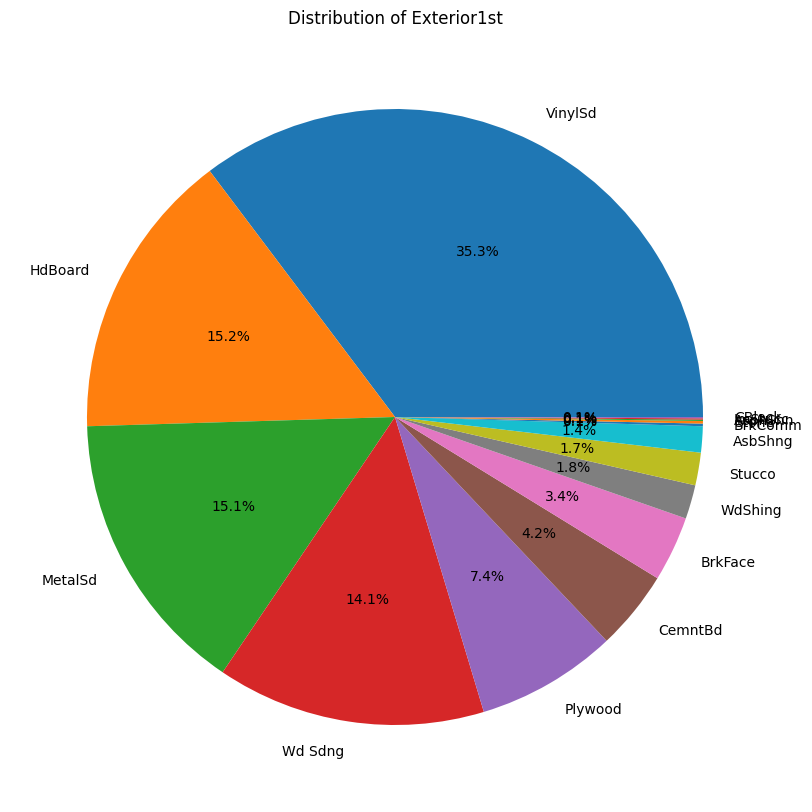



Pie plot for :  Exterior2nd


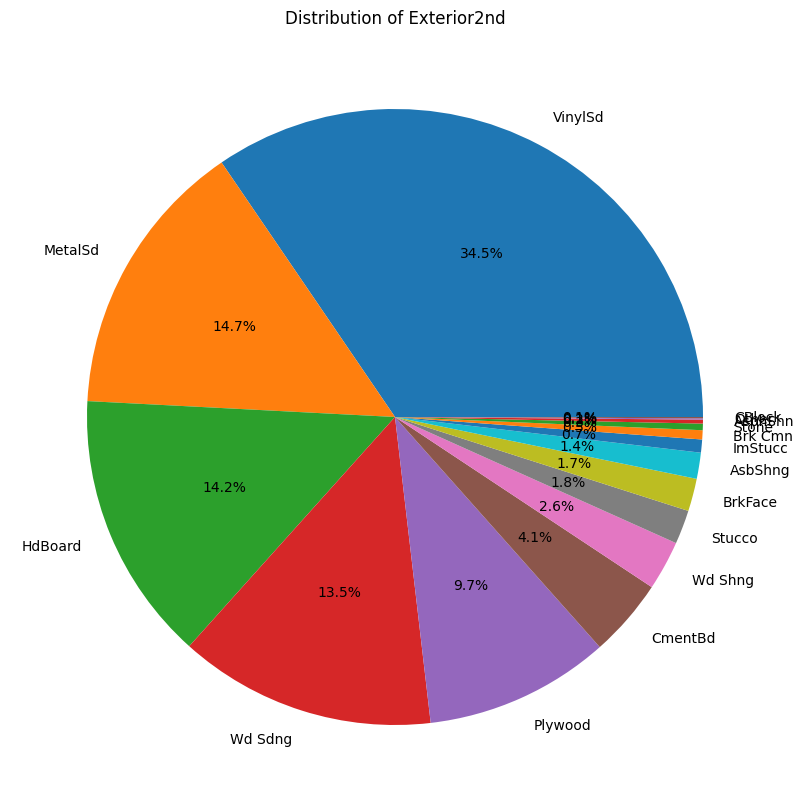



Pie plot for :  MasVnrType


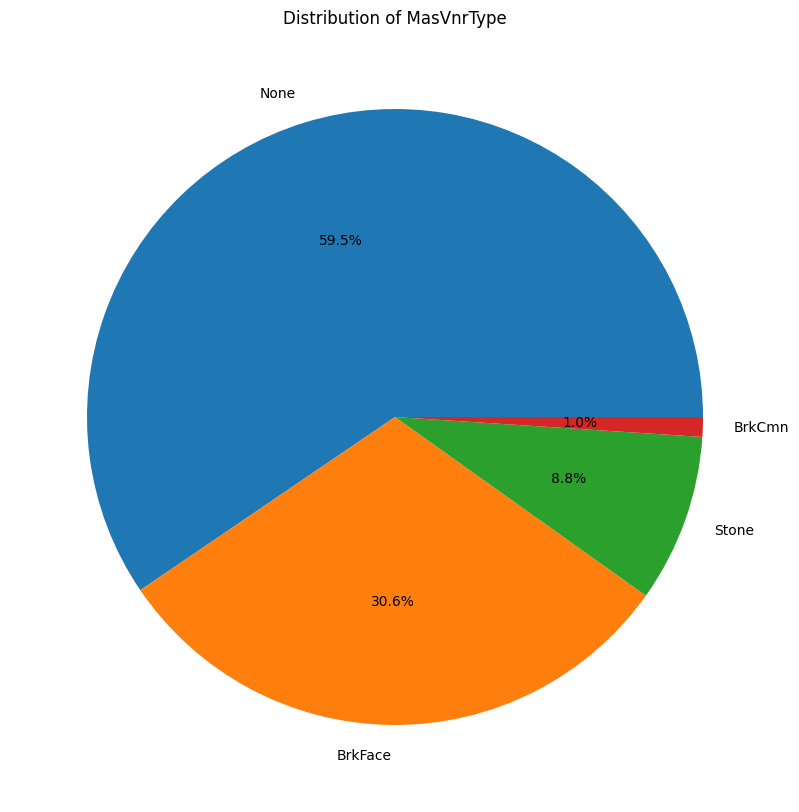



Pie plot for :  ExterQual


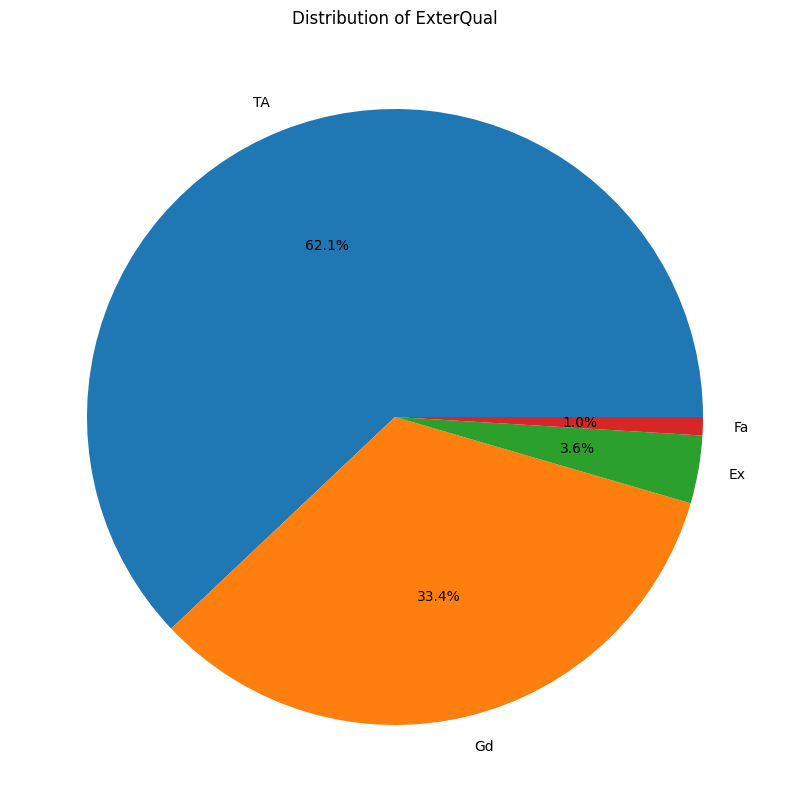



Pie plot for :  ExterCond


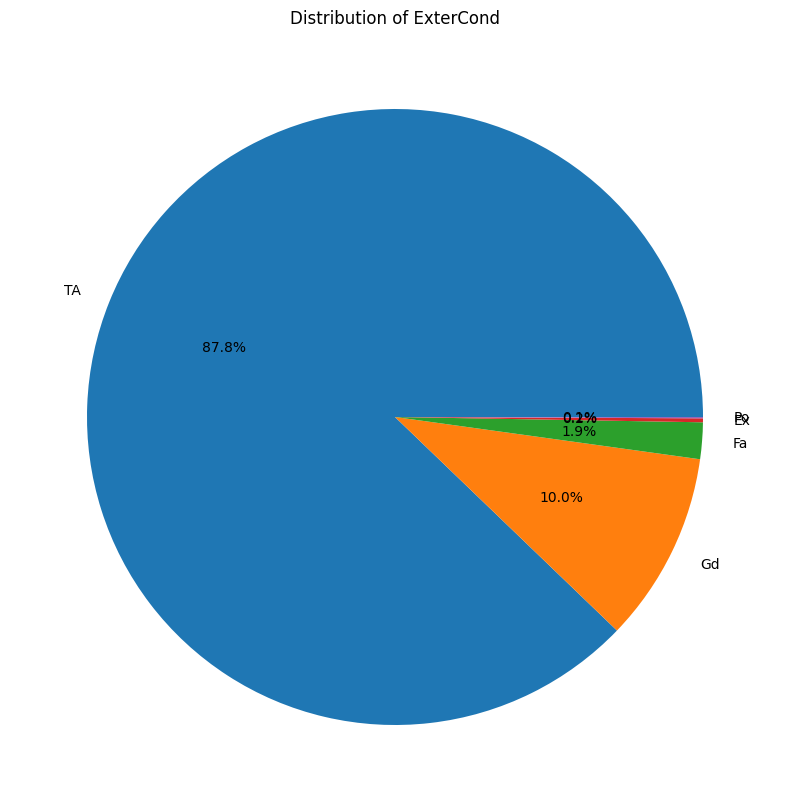



Pie plot for :  Foundation


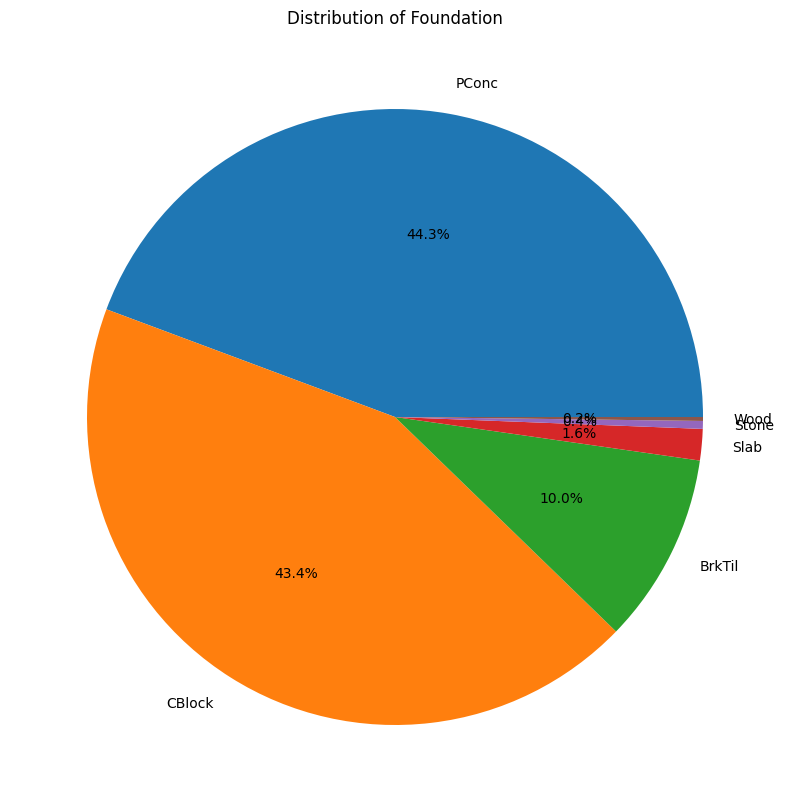



Pie plot for :  BsmtQual


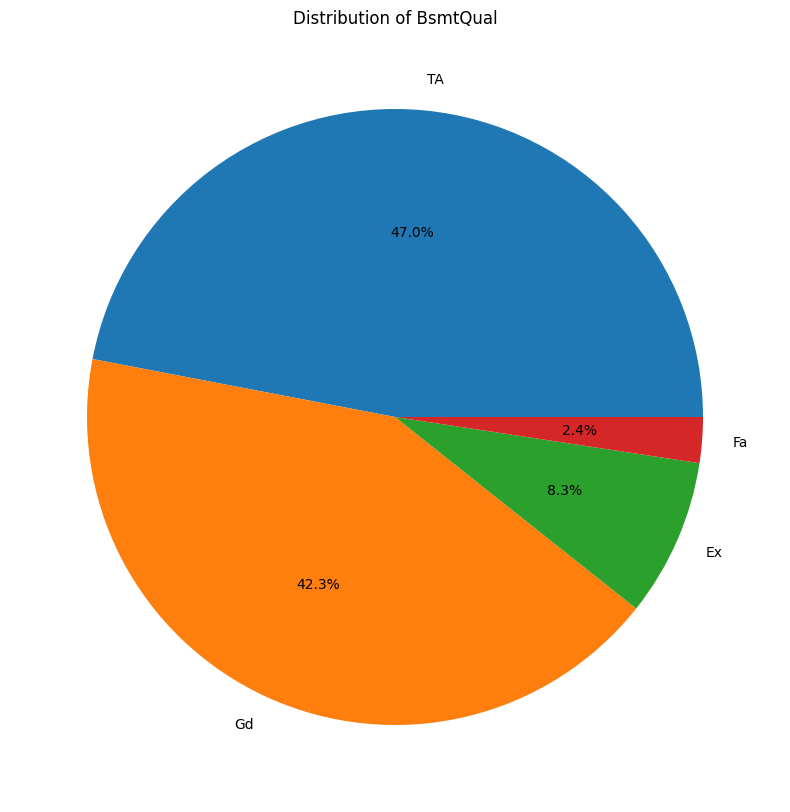



Pie plot for :  BsmtCond


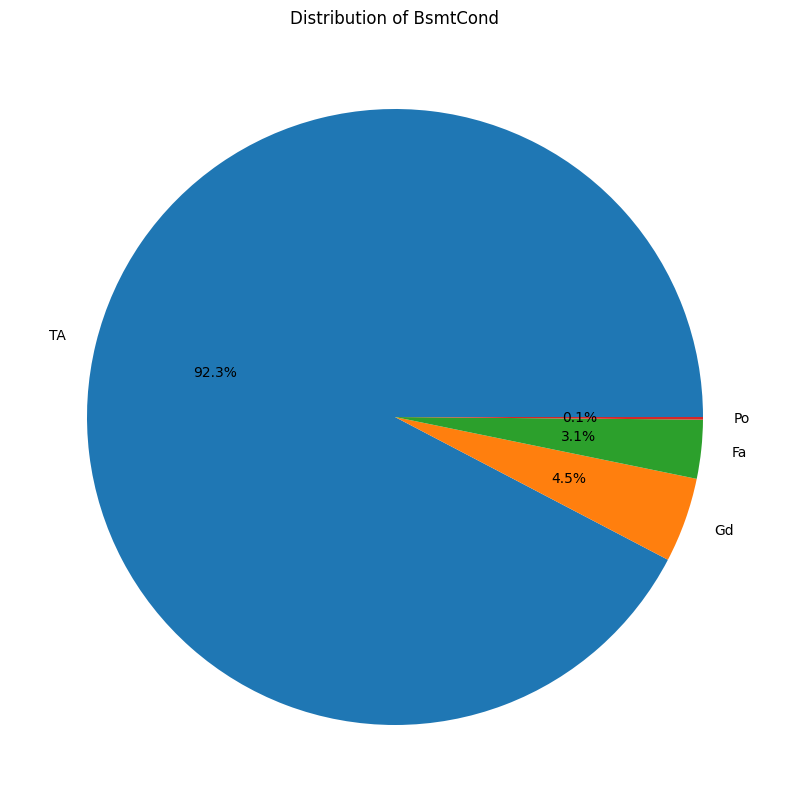



Pie plot for :  BsmtExposure


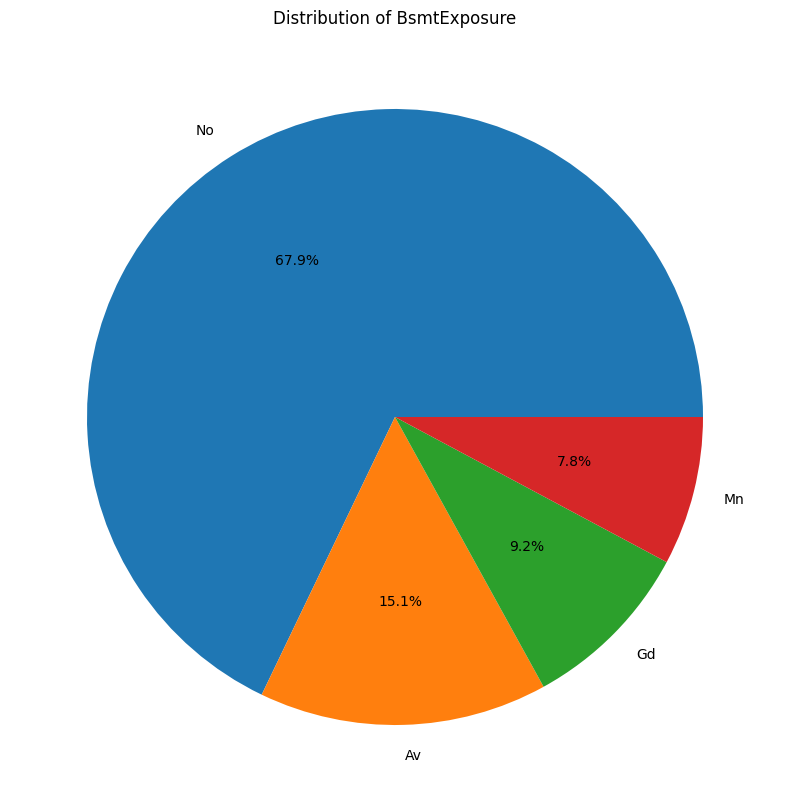



Pie plot for :  BsmtFinType1


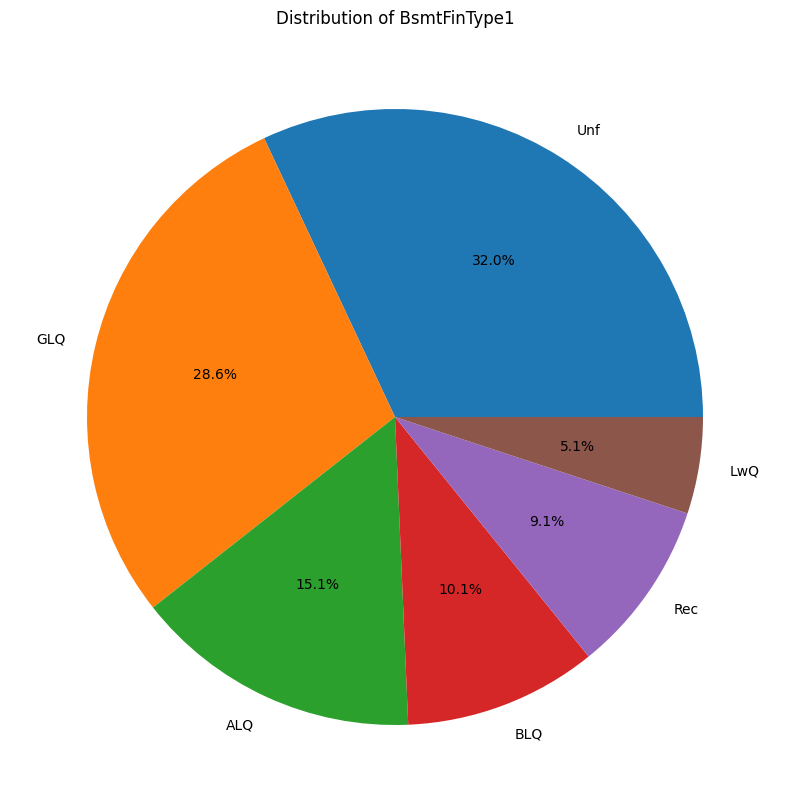



Pie plot for :  BsmtFinType2


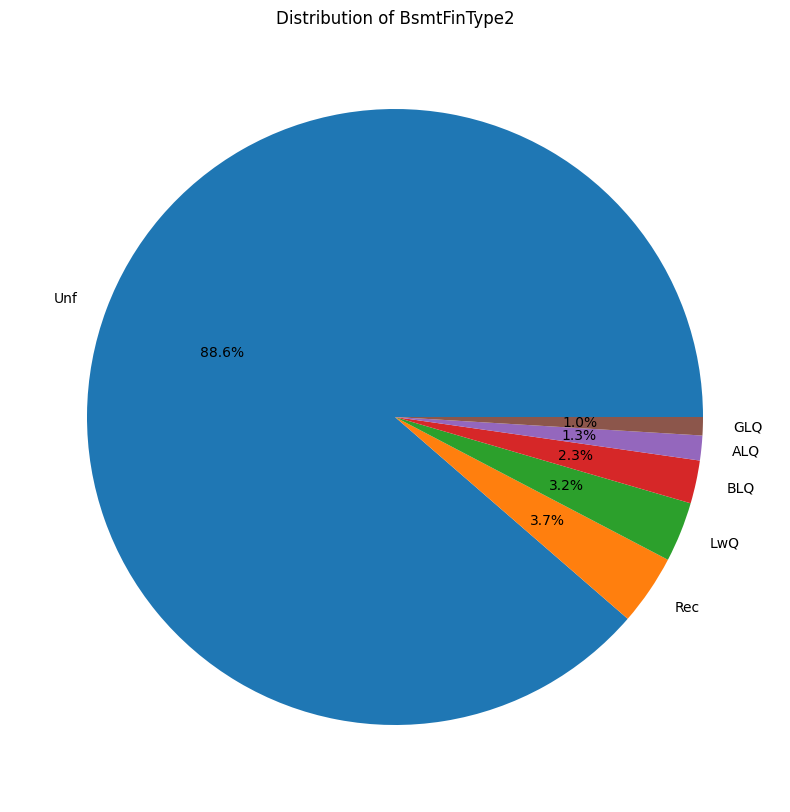



Pie plot for :  Heating


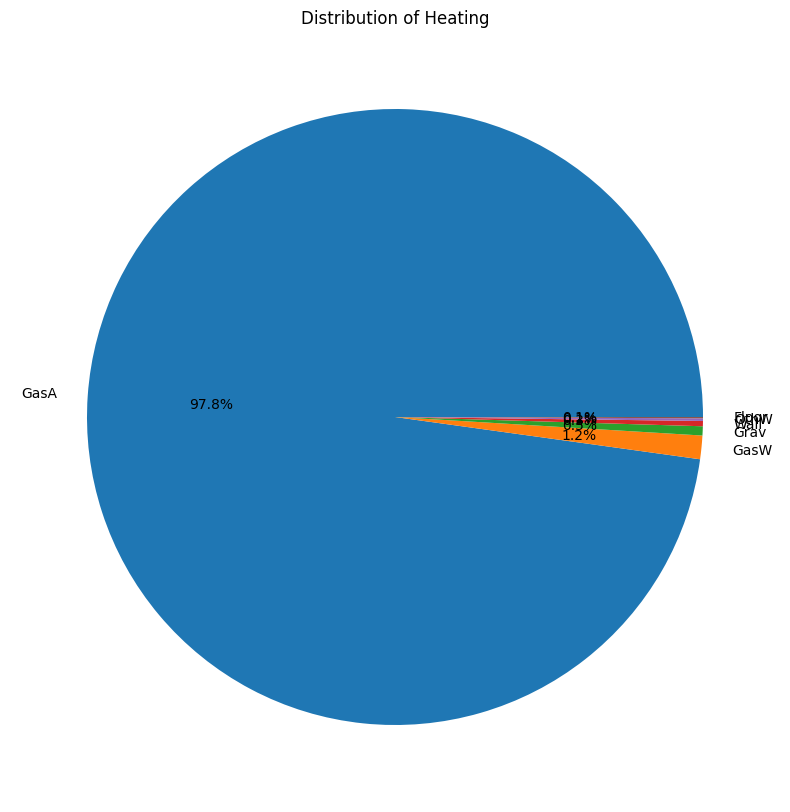



Pie plot for :  HeatingQC


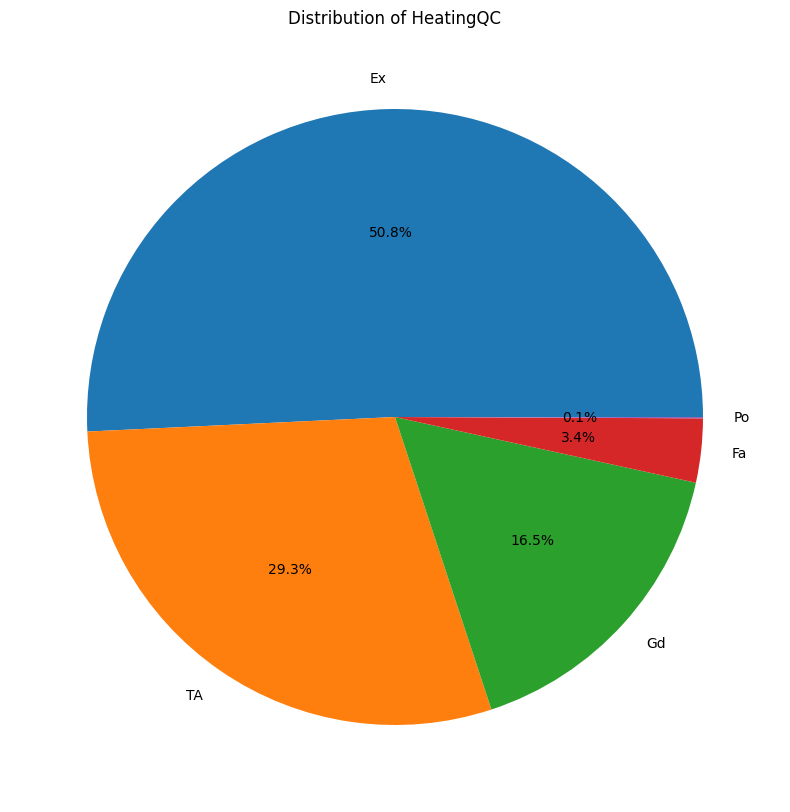



Pie plot for :  CentralAir


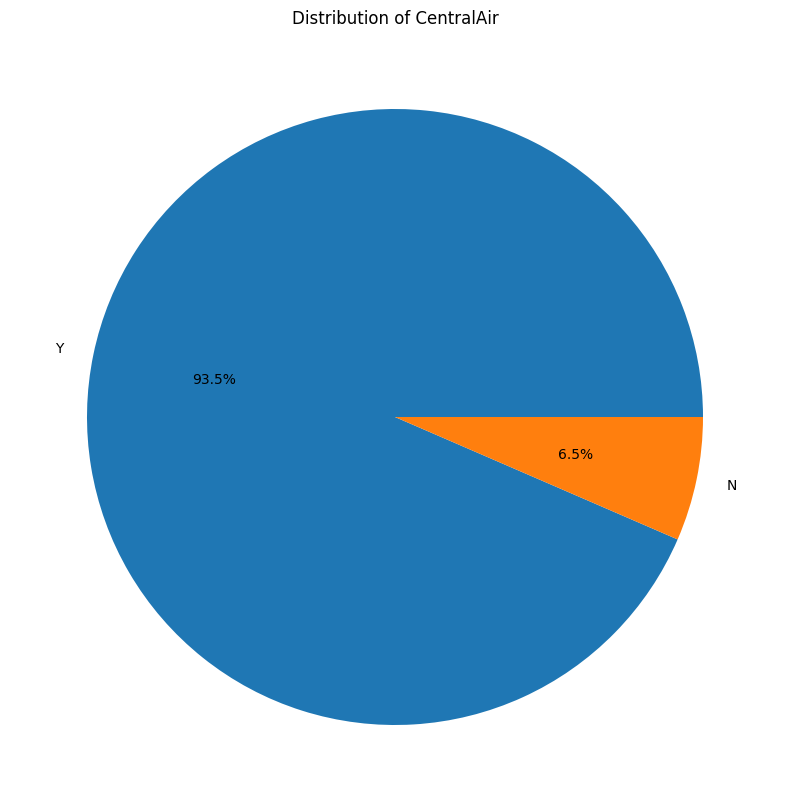



Pie plot for :  Electrical


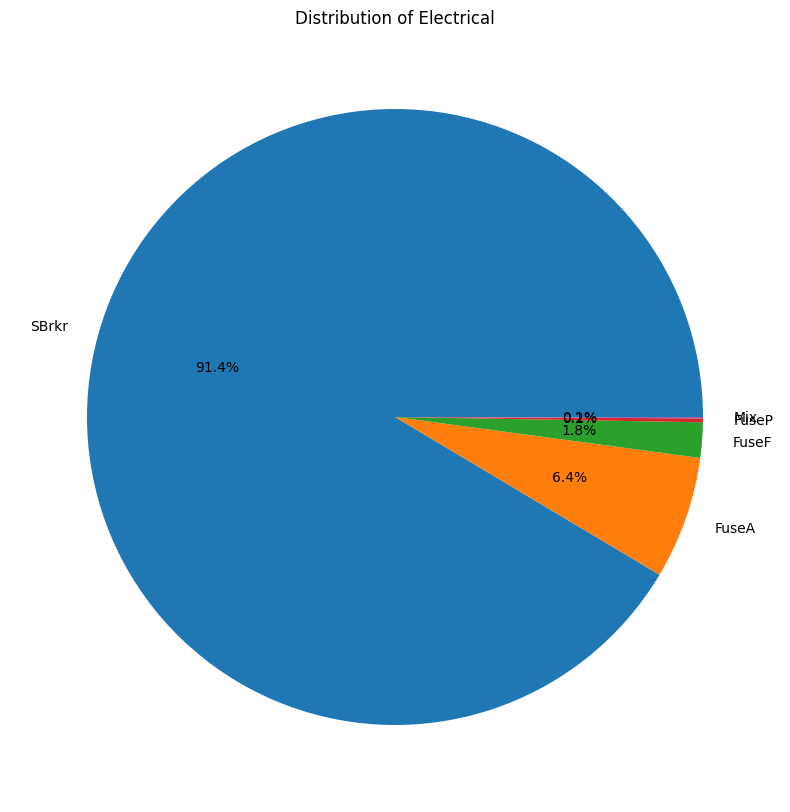



Pie plot for :  KitchenQual


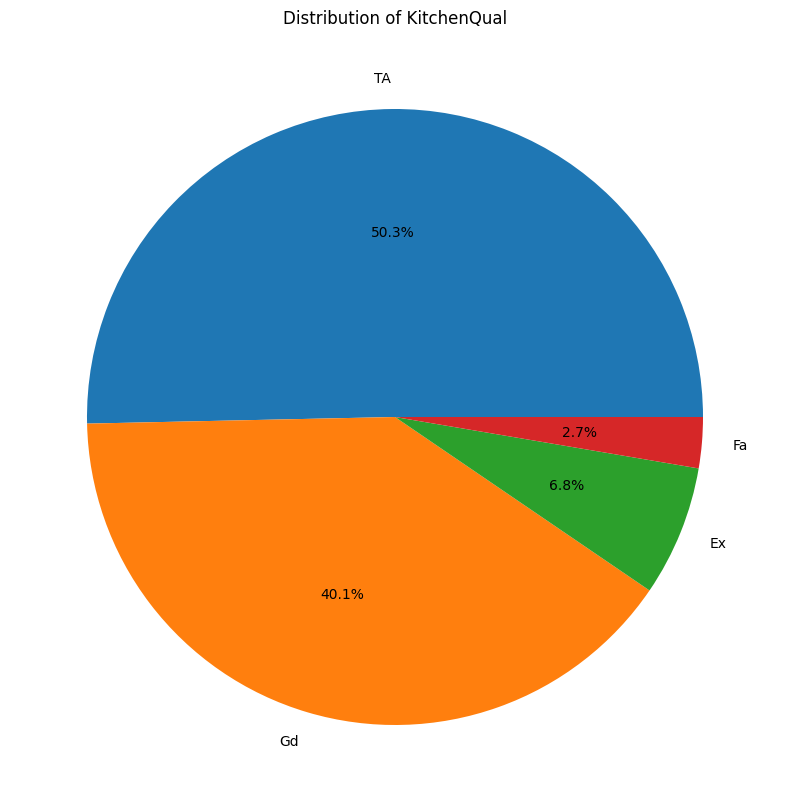



Pie plot for :  Functional


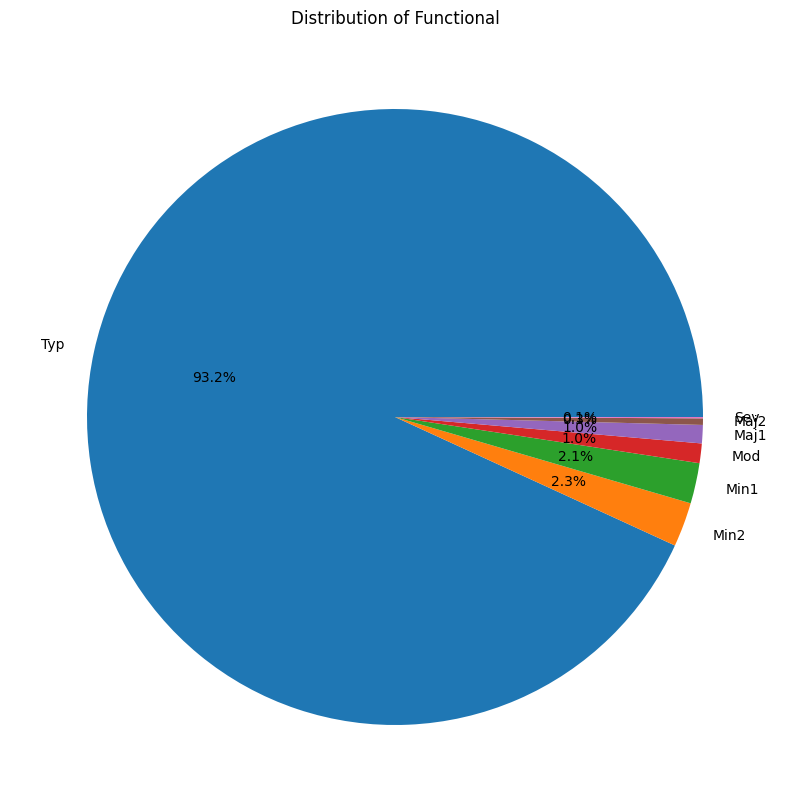



Pie plot for :  FireplaceQu


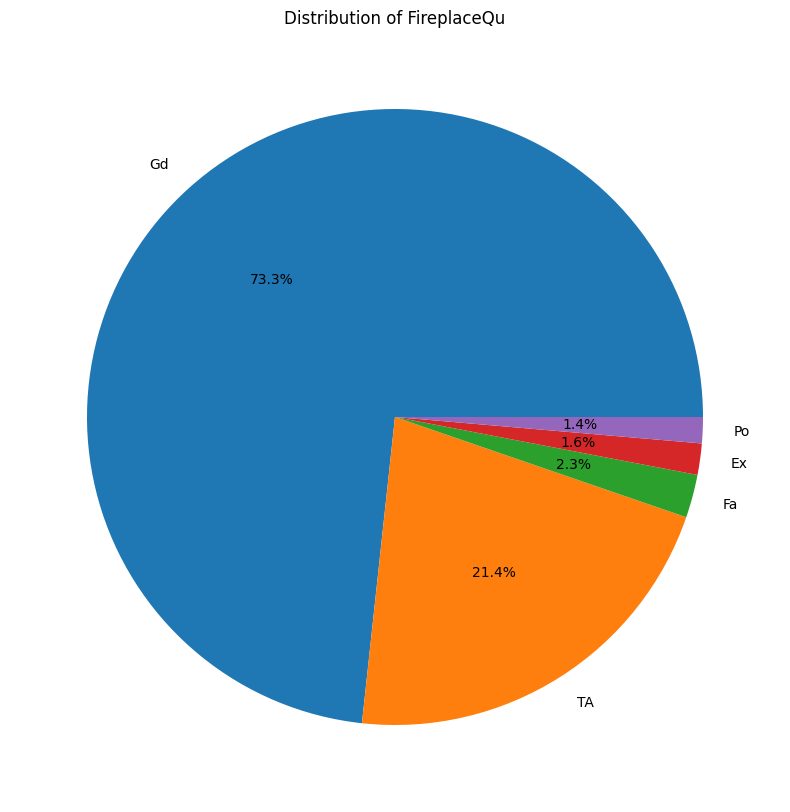



Pie plot for :  GarageType


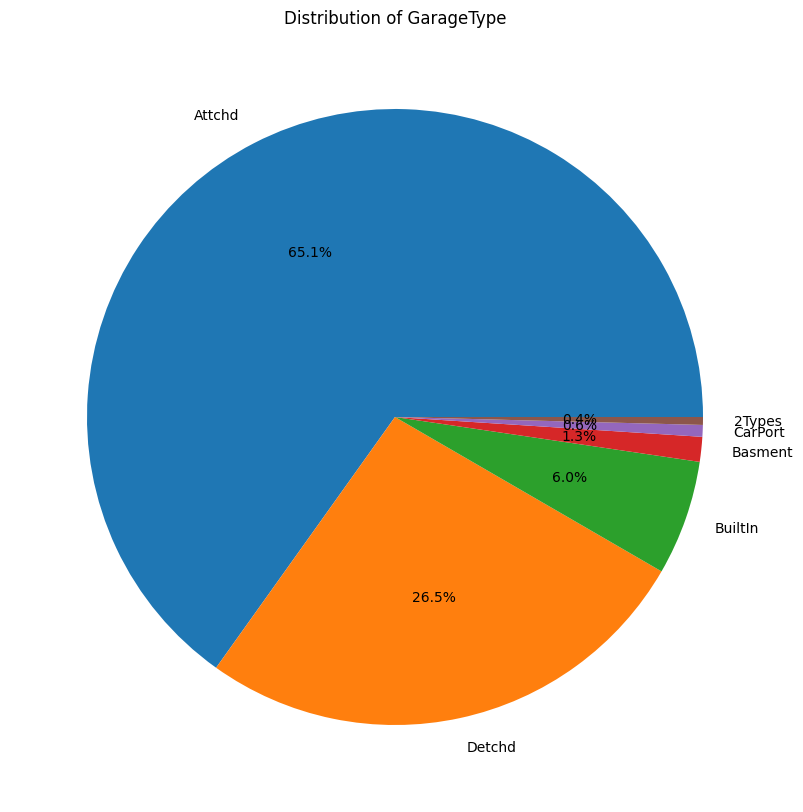



Pie plot for :  GarageFinish


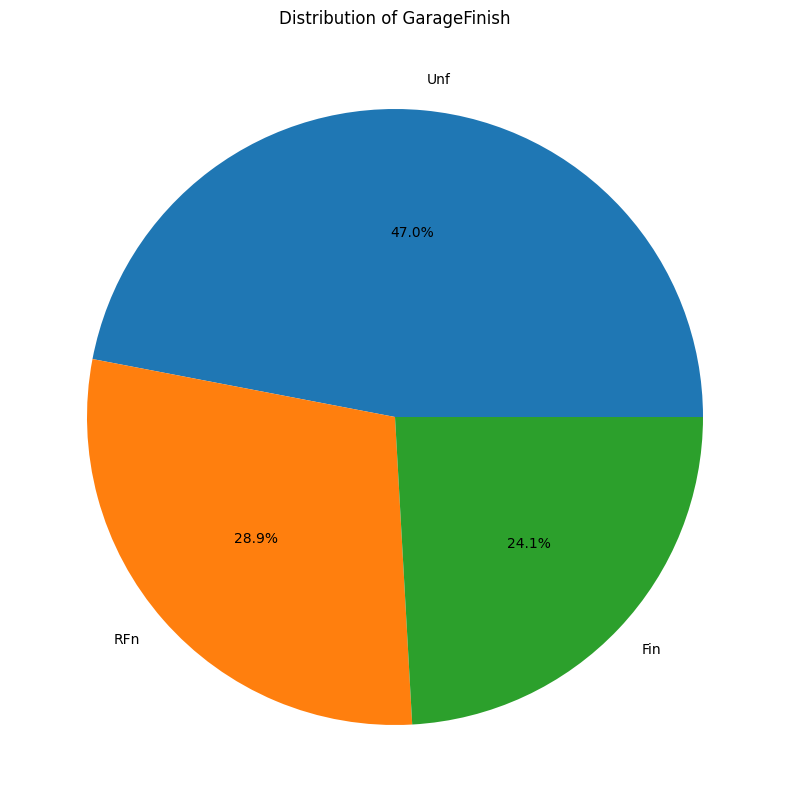



Pie plot for :  GarageQual


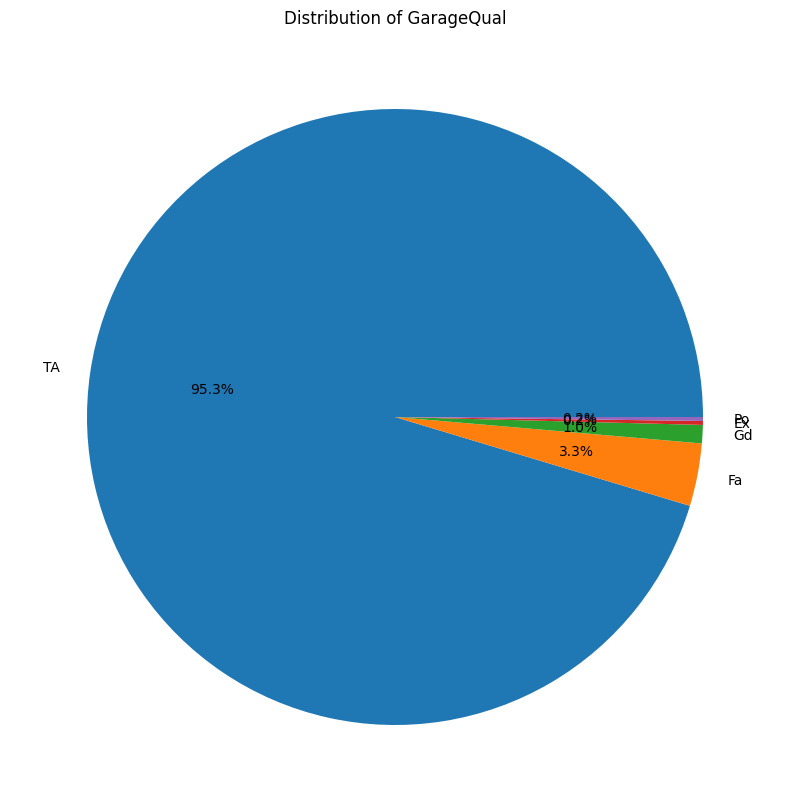



Pie plot for :  GarageCond


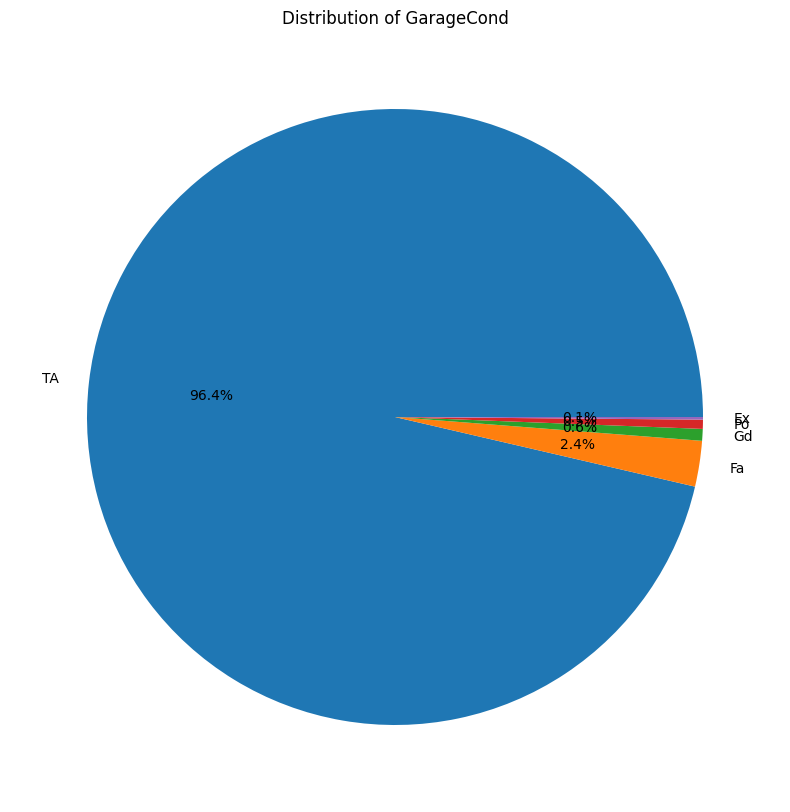



Pie plot for :  PavedDrive


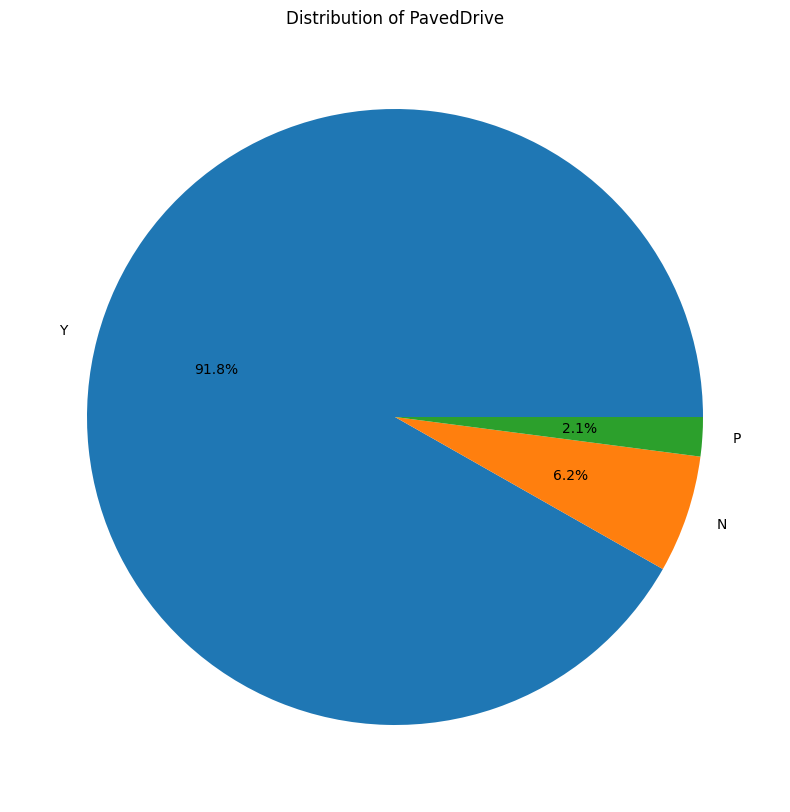



Pie plot for :  SaleType


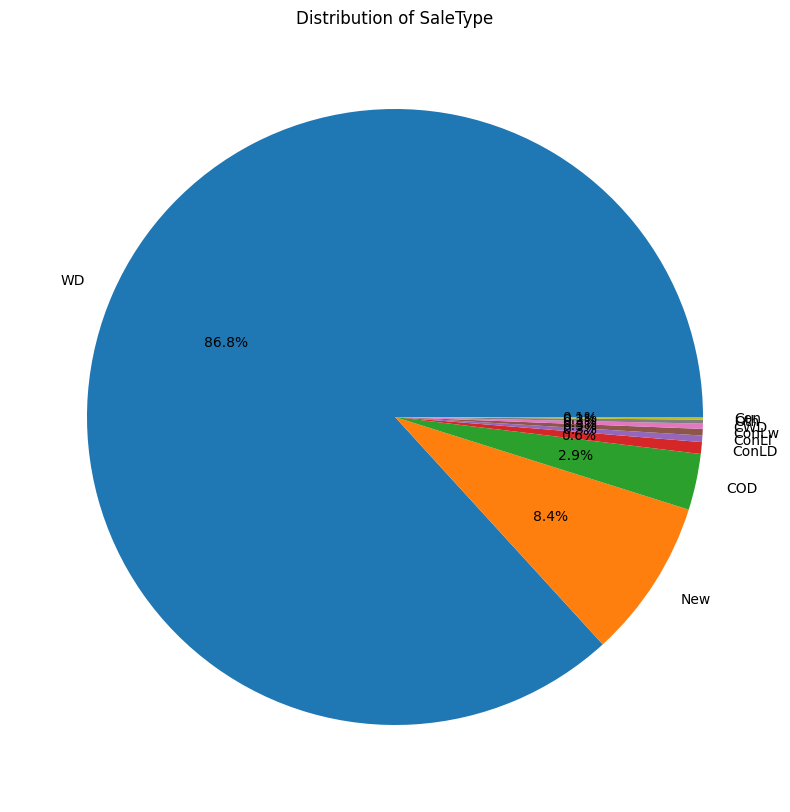



Pie plot for :  SaleCondition


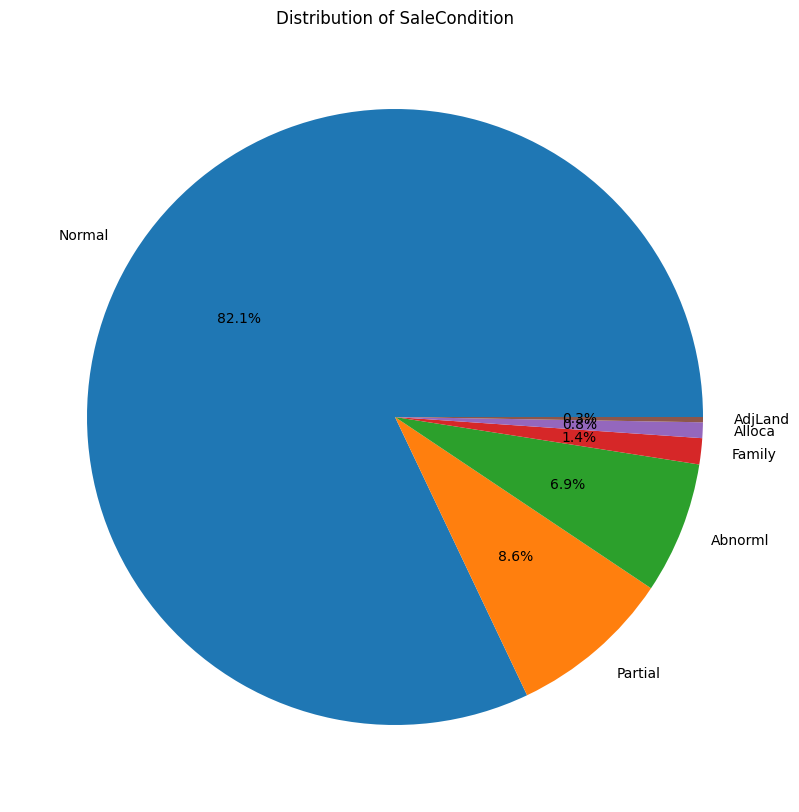

In [ ]:
for i in object_col:
  print('Pie plot for : ', i)
  plt.figure(figsize = (20, 10))
  df[i].value_counts().plot(kind = 'pie', autopct = '%1.1f%%')
  plt.title("Distribution of " + i)
  plt.ylabel('')
  plt.show()
  print('\n')

In [ ]:
#count plot using plotly we can use this as reference
for i in object_col:
  fig = go.Figure(data = [go.Bar(x = df[i].value_counts().index, y = df[i].value_counts())])
  fig.update_layout(
      title = i,
      xaxis_title = i,
      yaxis_title = 'Count')
  fig.show()

In [ ]:
#pie plot using plotly we can use this as reference
for i in object_col:
  print('Pie plot for : ', i)
  fig = px.pie(df, names = i, title = 'Distribution of ' + i)
  fig.show()
  print('\n')

Pie plot for :  MSZoning




Pie plot for :  Street




Pie plot for :  LotShape




Pie plot for :  LandContour




Pie plot for :  Utilities




Pie plot for :  LotConfig




Pie plot for :  LandSlope




Pie plot for :  Neighborhood




Pie plot for :  Condition1




Pie plot for :  Condition2




Pie plot for :  BldgType




Pie plot for :  HouseStyle




Pie plot for :  RoofStyle




Pie plot for :  RoofMatl




Pie plot for :  Exterior1st




Pie plot for :  Exterior2nd




Pie plot for :  MasVnrType




Pie plot for :  ExterQual




Pie plot for :  ExterCond




Pie plot for :  Foundation




Pie plot for :  BsmtQual




Pie plot for :  BsmtCond




Pie plot for :  BsmtExposure




Pie plot for :  BsmtFinType1




Pie plot for :  BsmtFinType2




Pie plot for :  Heating




Pie plot for :  HeatingQC




Pie plot for :  CentralAir




Pie plot for :  Electrical




Pie plot for :  KitchenQual




Pie plot for :  Functional




Pie plot for :  FireplaceQu




Pie plot for :  GarageType




Pie plot for :  GarageFinish




Pie plot for :  GarageQual




Pie plot for :  GarageCond




Pie plot for :  PavedDrive




Pie plot for :  SaleType




Pie plot for :  SaleCondition


**PLOTS FOR NUMERICAL UNIVARIANT**

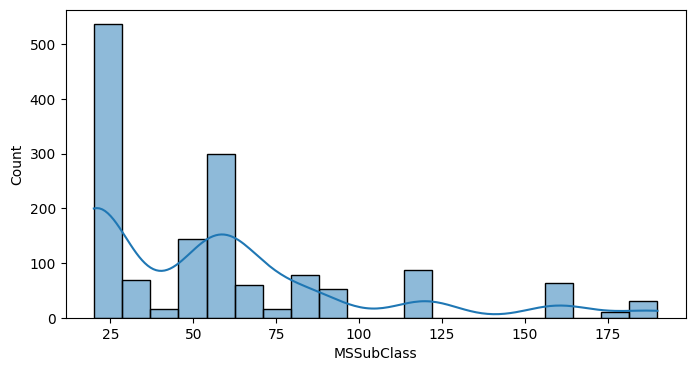

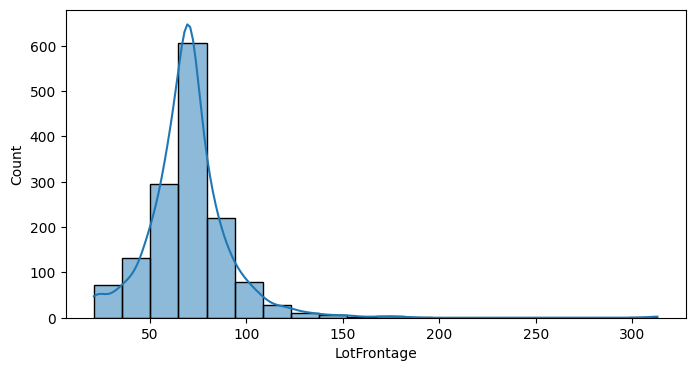

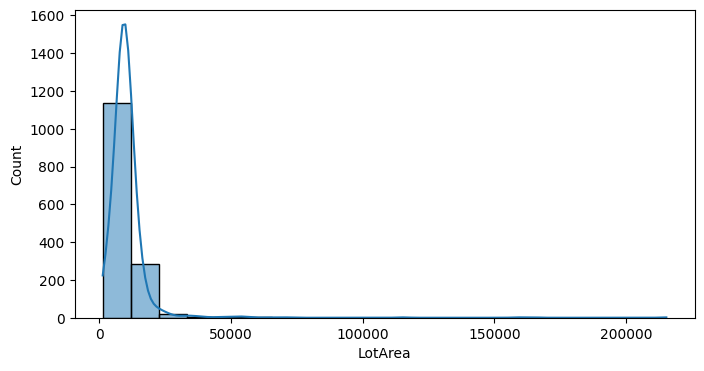

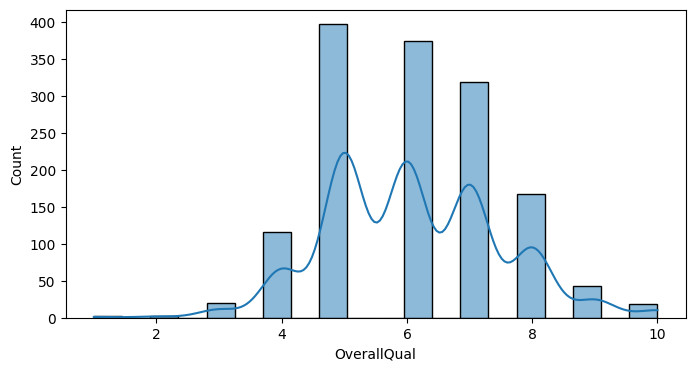

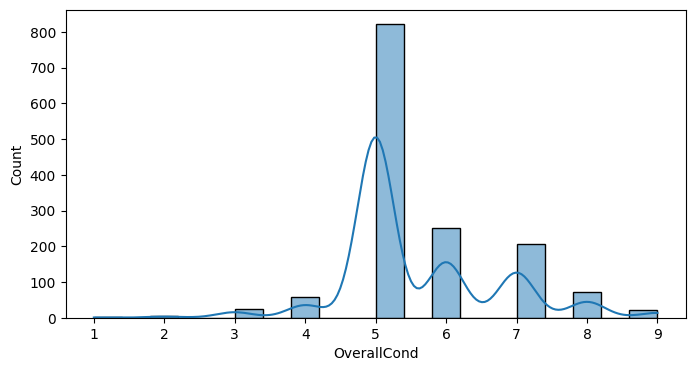

...

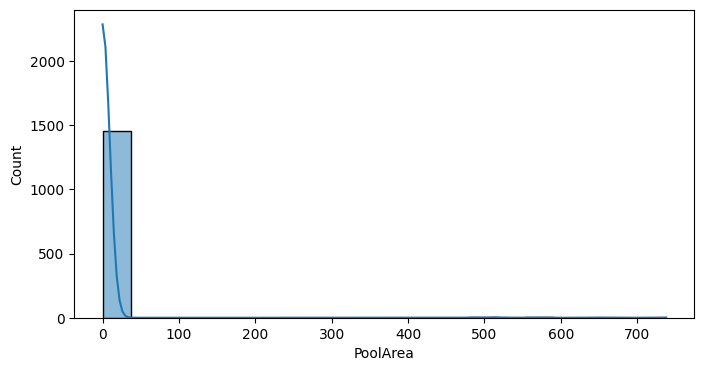

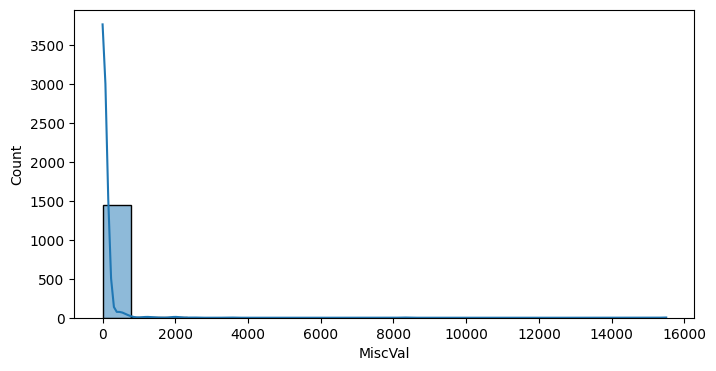

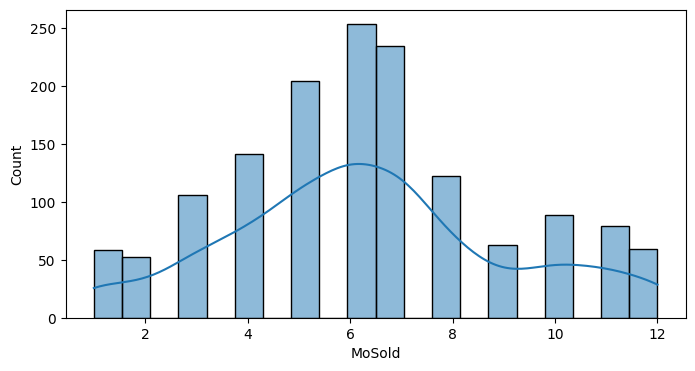

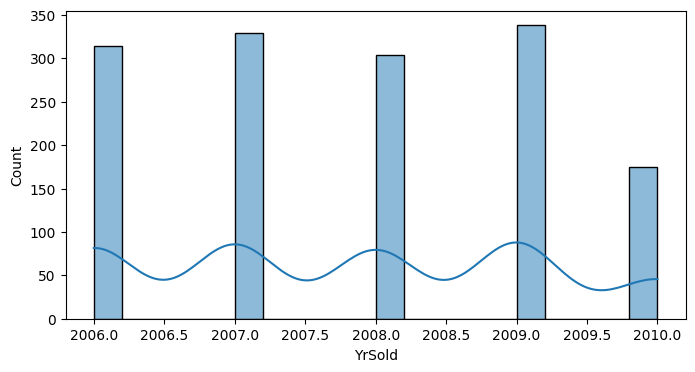

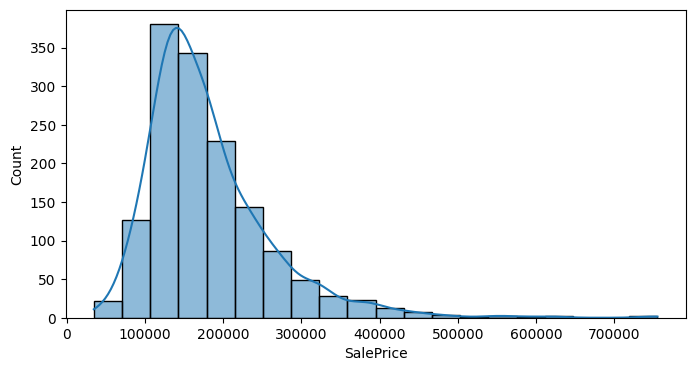

In [ ]:
for i in numeric_col:
  plt.figure(figsize = (8, 4))
  sns.histplot(df[i], kde = True, bins = 20, palette = 'hls')
  plt.xticks(rotation = 0)
  plt.show()

distplot using seaborn

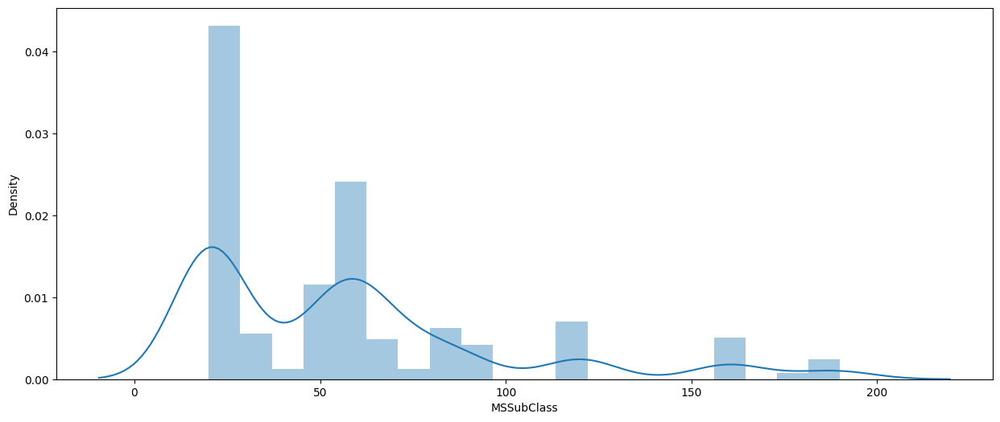

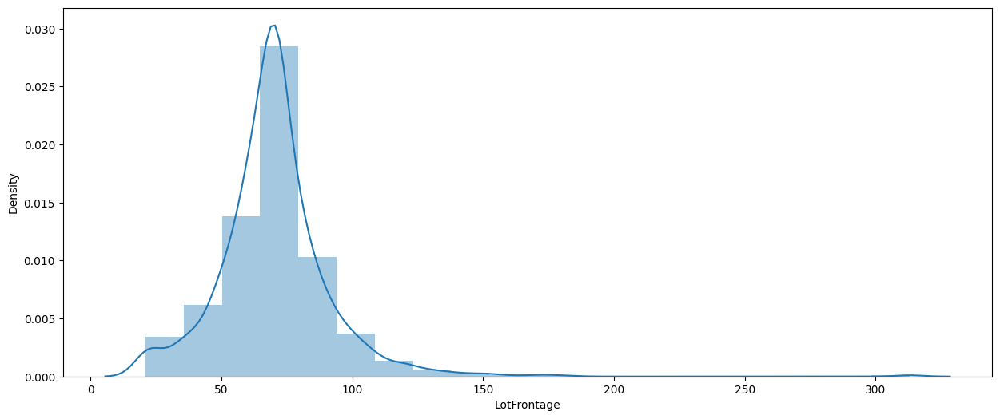

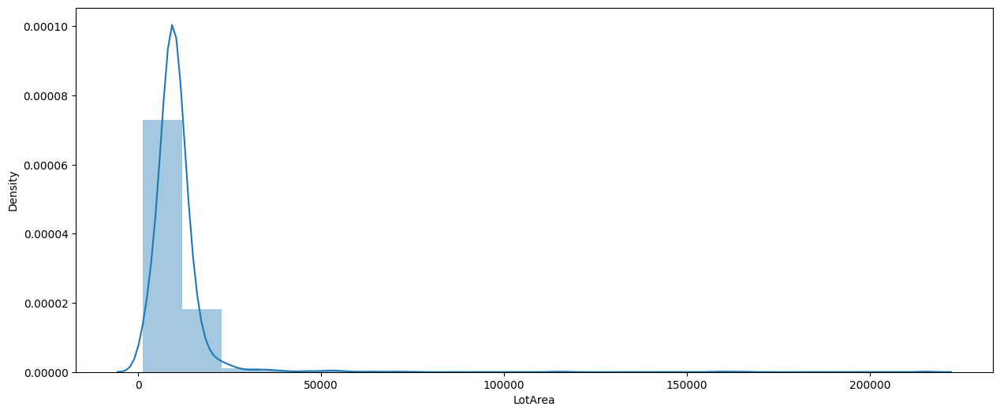

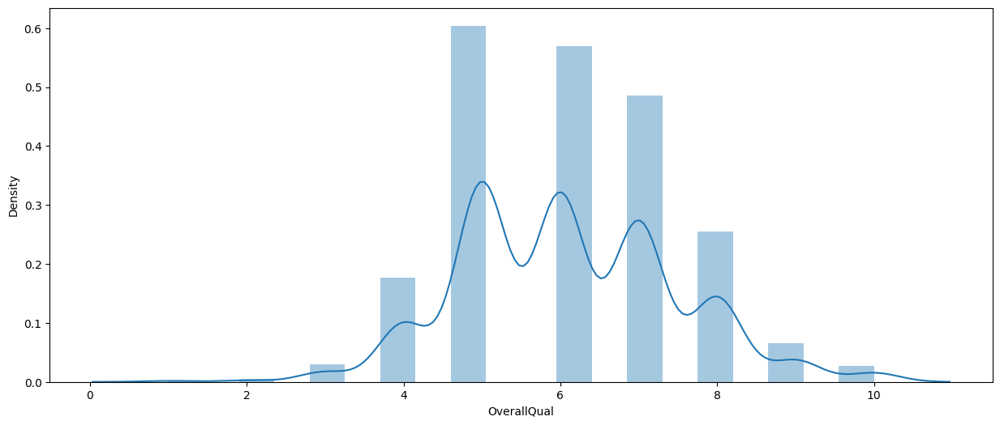

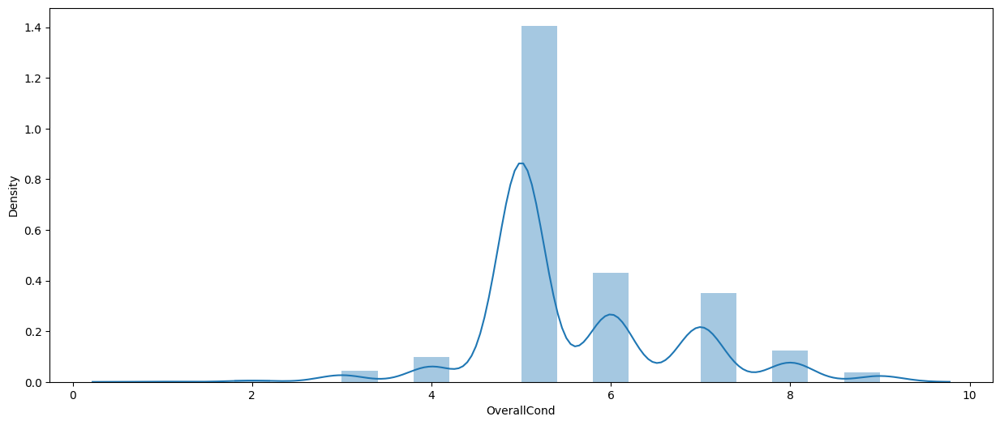

...

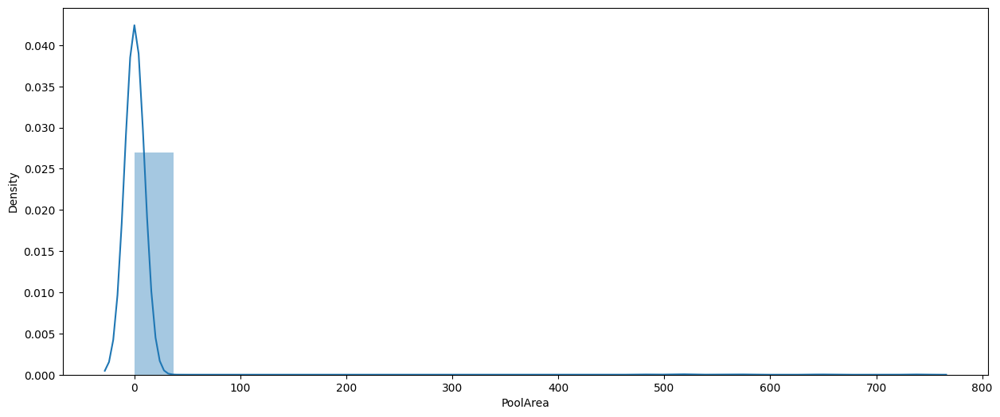

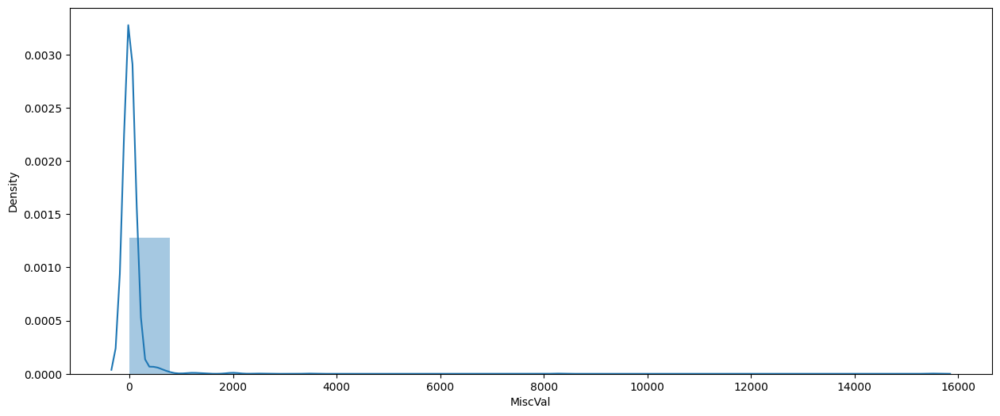

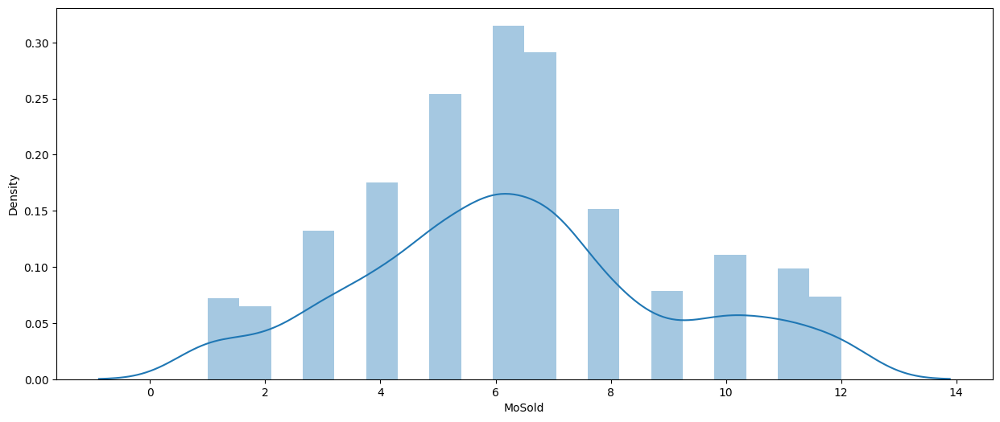

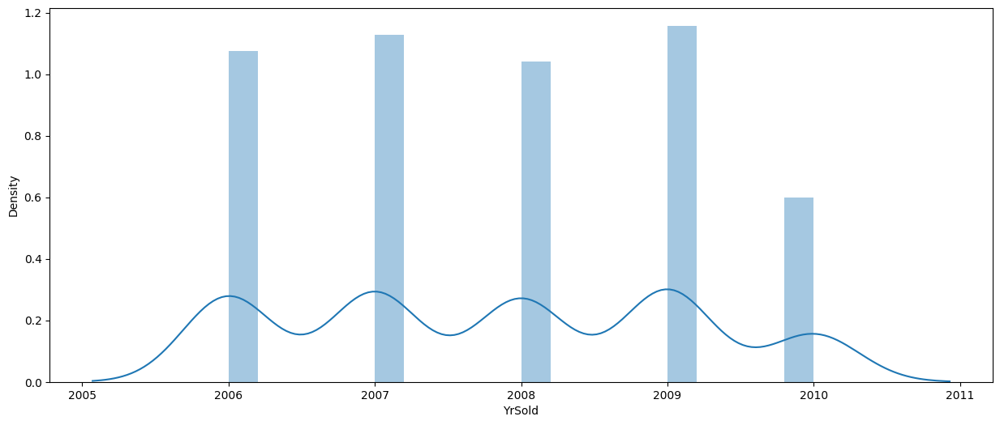

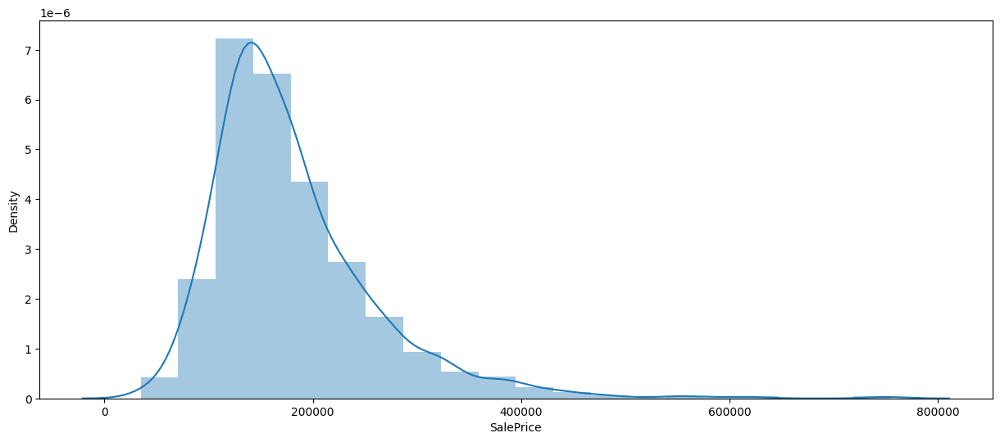

In [ ]:
for i in numeric_col:
  plt.figure(figsize = (15, 6))
  sns.distplot(df[i], kde = True, bins = 20)
  plt.xticks(rotation = 0)
  plt.show()

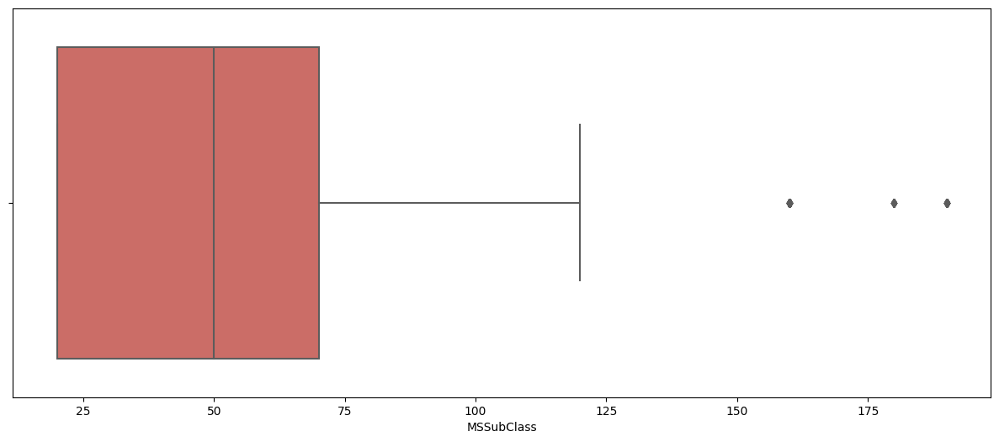

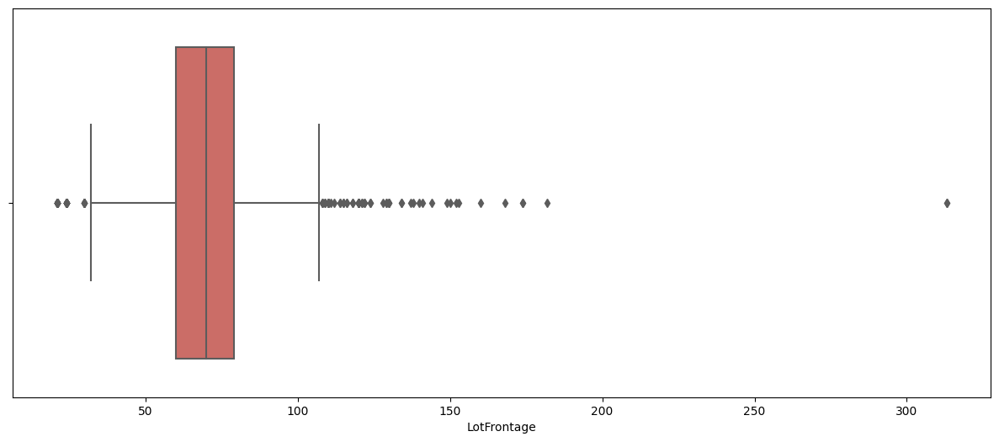

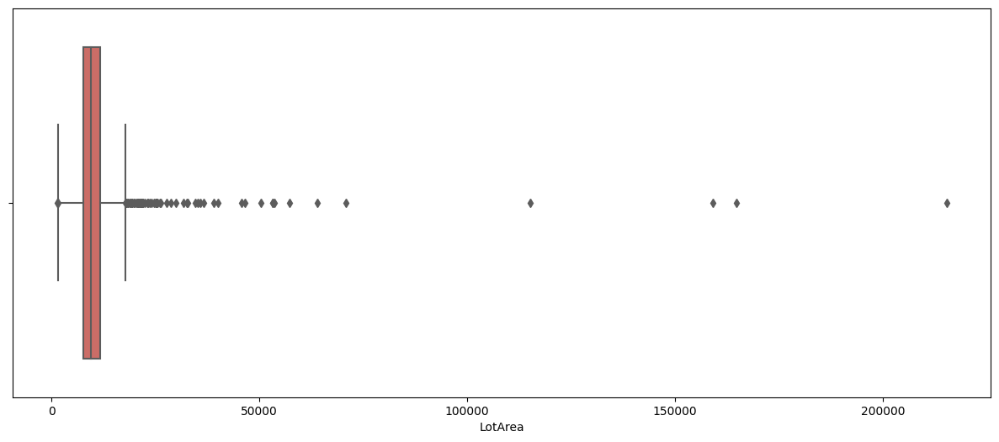

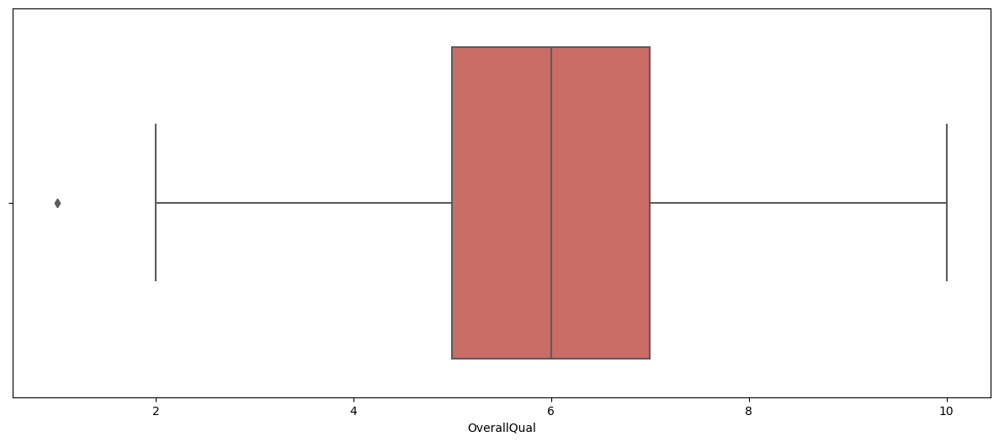

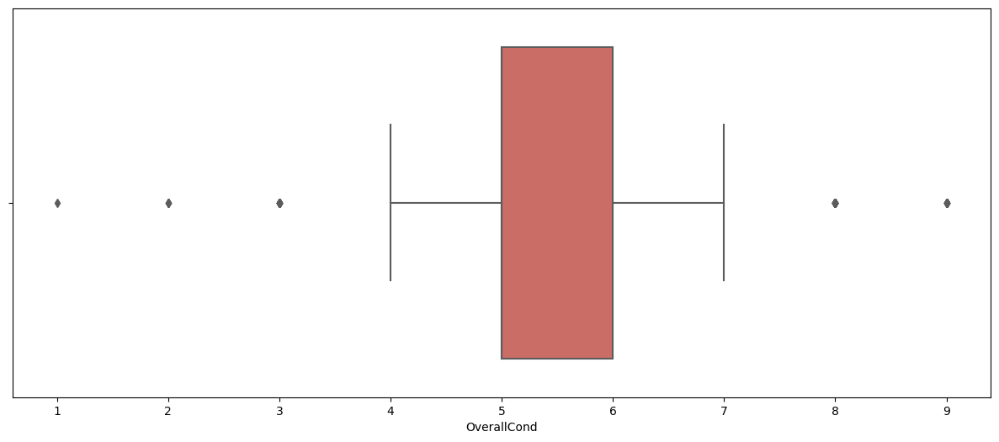

...

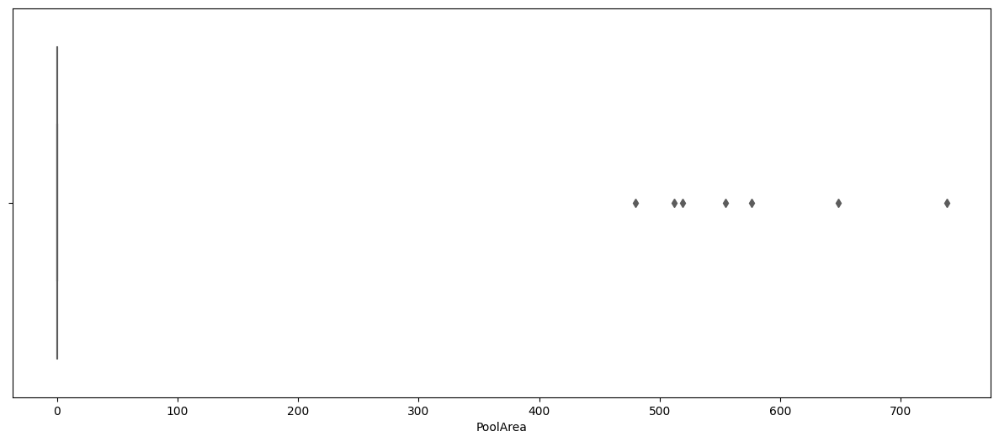

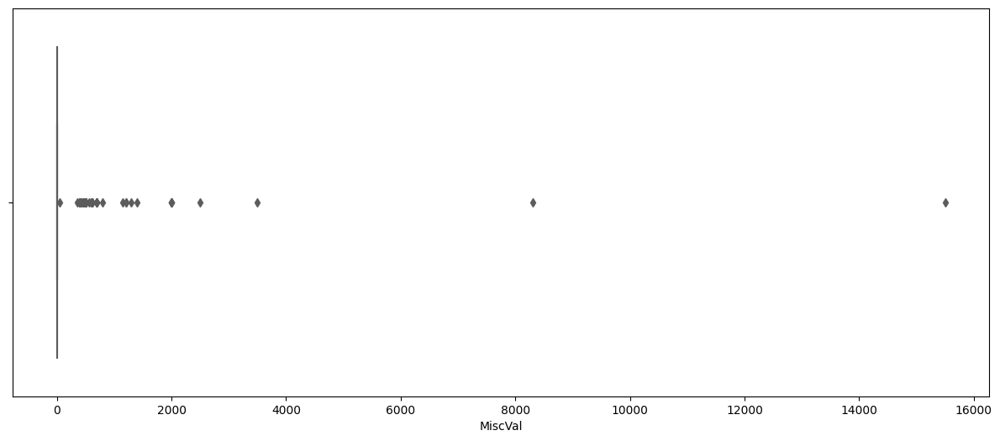

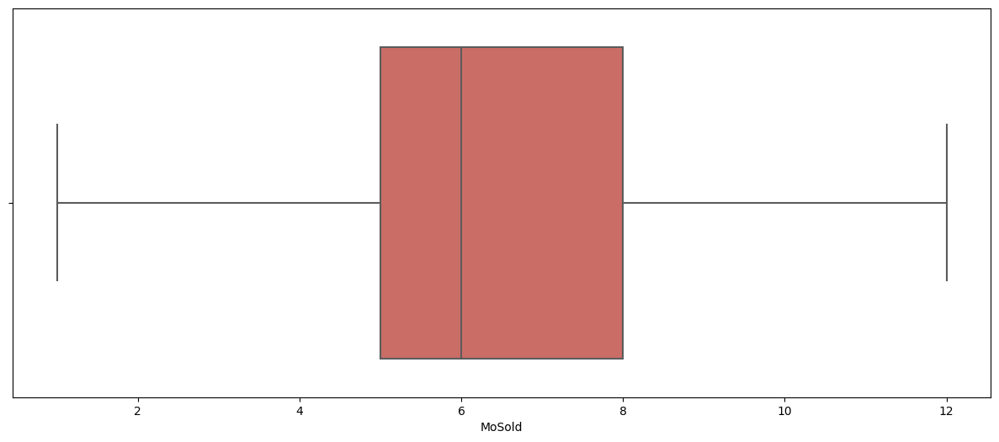

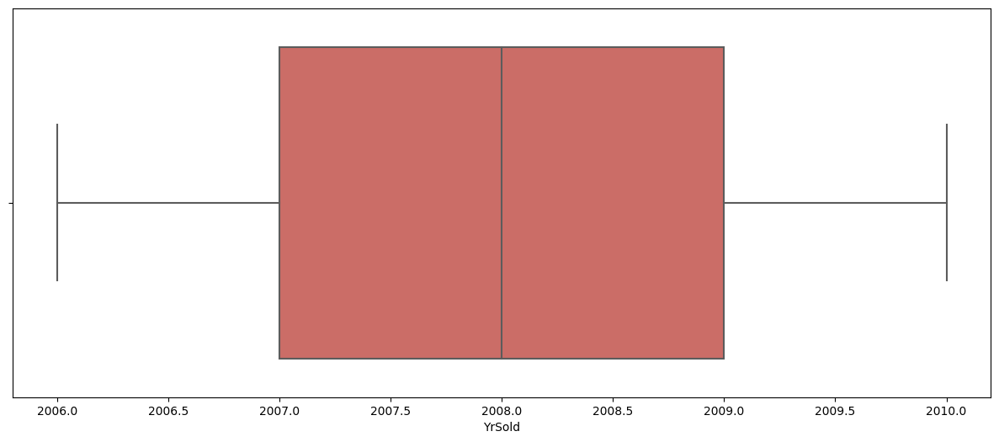

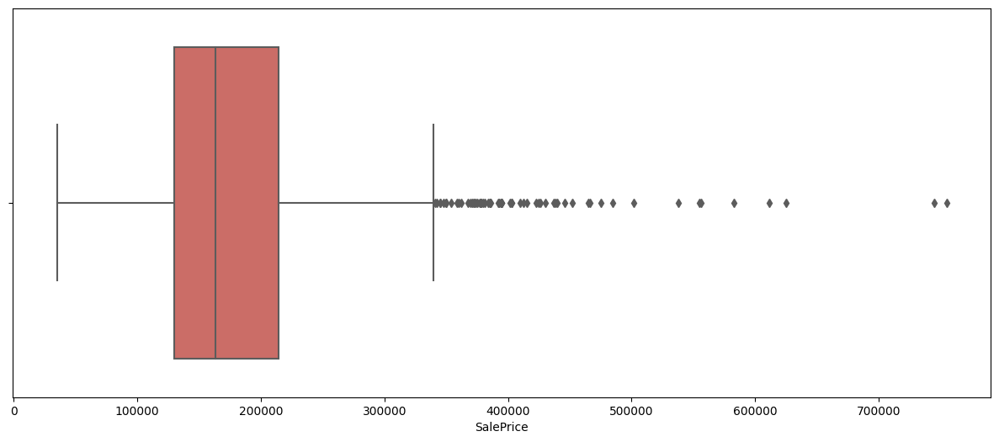

In [ ]:
for i in numeric_col:
  plt.figure(figsize = (15, 6))
  sns.boxplot(x = df[i],data =  df, palette = 'hls')
  plt.xticks(rotation = 0)
  plt.show()

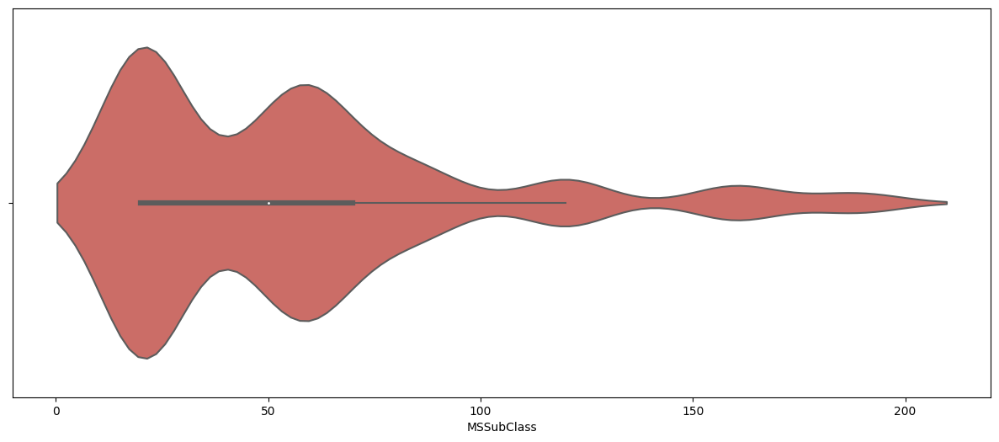

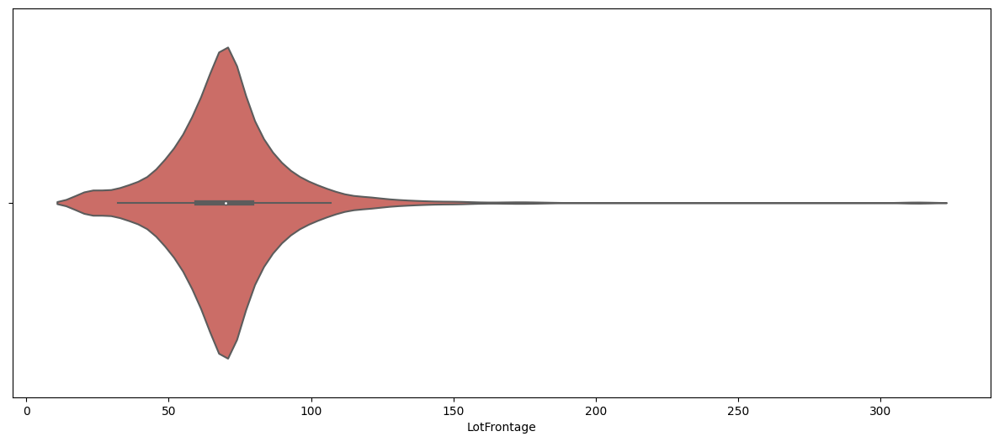

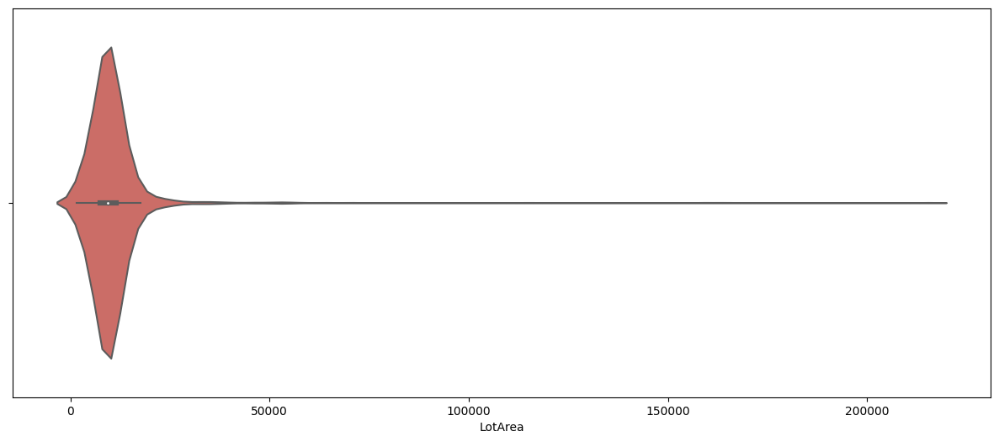

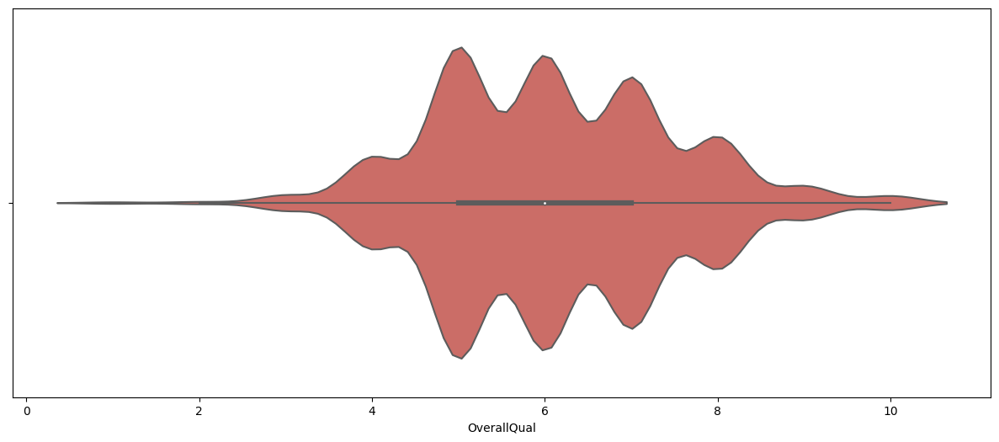

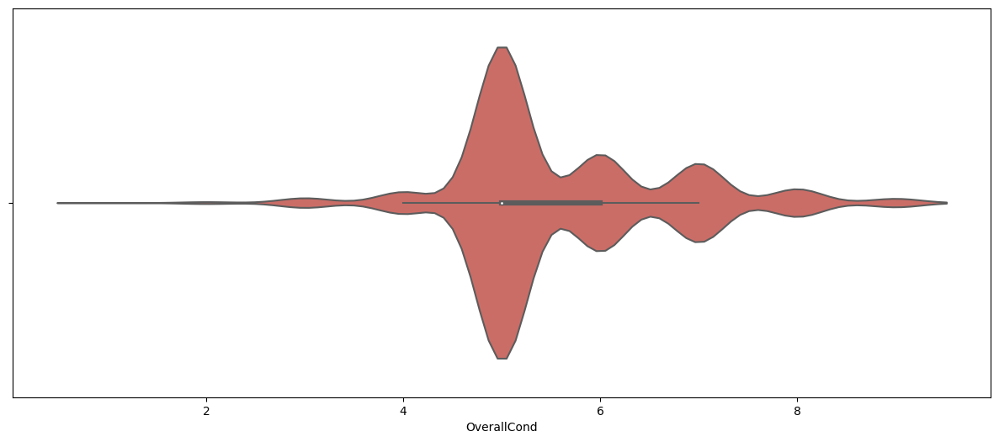

...

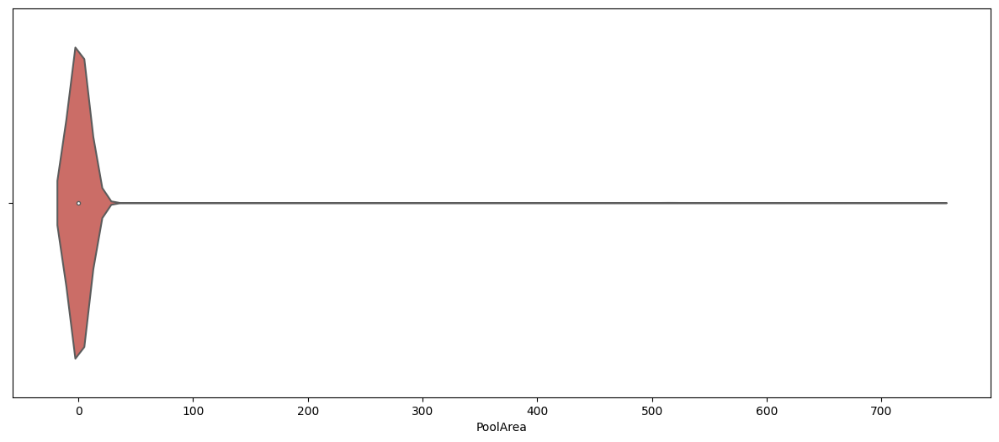

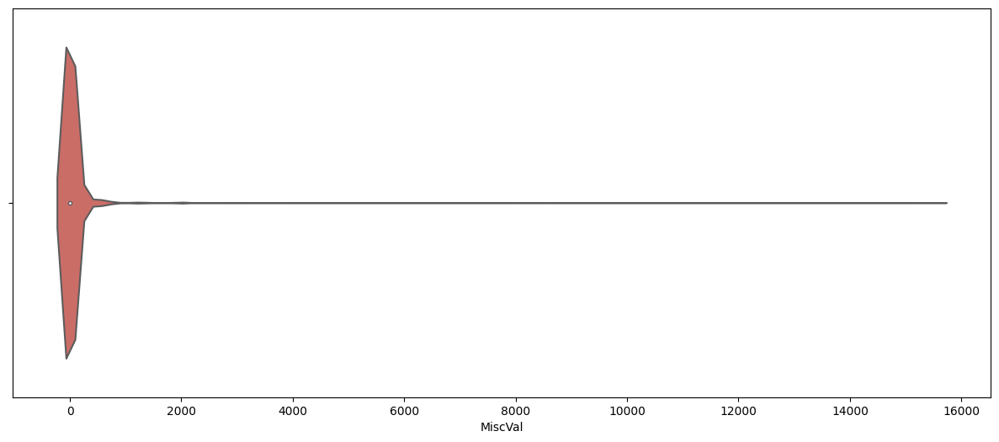

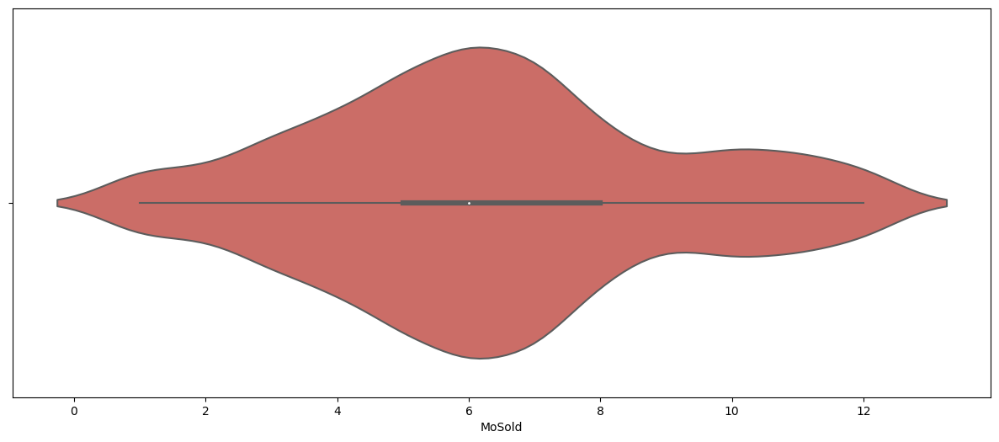

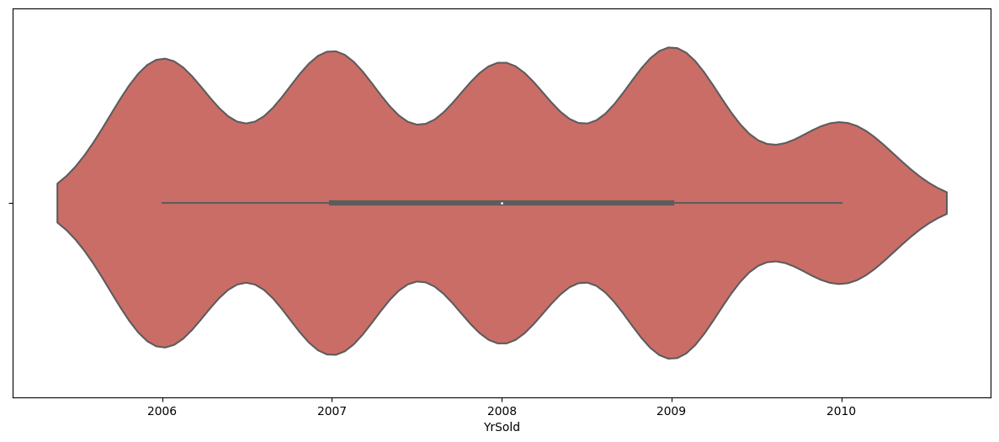

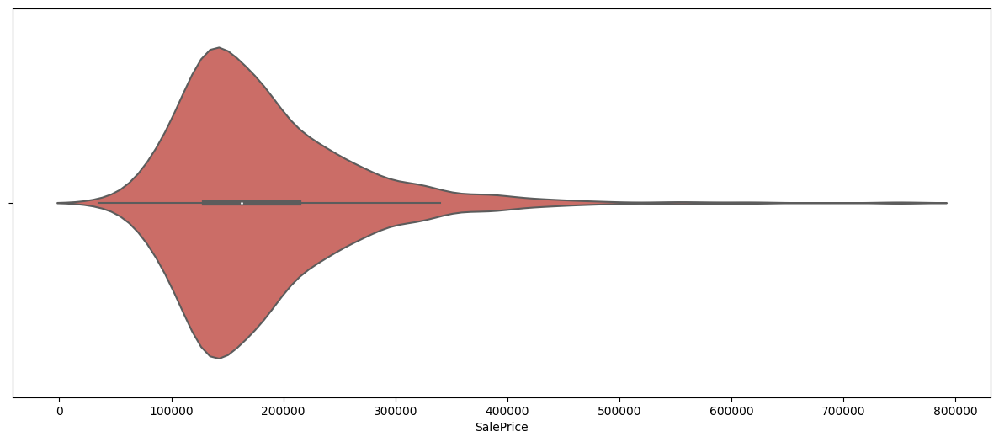

In [ ]:
for i in numeric_col:
  plt.figure(figsize = (15, 6))
  sns.violinplot(x = df[i],data =  df, palette = 'hls')
  plt.xticks(rotation = 0)
  plt.show()

In [ ]:
for i in numeric_col:
  fig = go.Figure(data = [go.Histogram(x = df[i], nbinsx = 20)])
  fig.update_layout(
      title = i,
      xaxis_title = i,
      yaxis_title = "Count")
  fig.show()

In [ ]:
for i in numeric_col:
  fig = go.Figure(data = [go.Box(x = df[i])])
  fig.update_layout(
      title = i,
      xaxis_title = i,
      yaxis_title = "Value")
  fig.show()

In [ ]:
for i in numeric_col:
  fig = go.Figure(data = [go.Violin(x = df[i])])
  fig.update_layout(
      title = i,
      xaxis_title = i,
      yaxis_title = "Value")
  fig.show()

****BIVARIANT****

In [ ]:
# for i in numeric_col:
#   for j in object_col:
#     plt.figure(figsize = (8, 4))
#     sns.barplot(x = df[j], y = df[i], data = df, ci = None, palette = 'hls')
#     plt.show()

In [ ]:
# #in the same way we make box plot and violen plot
# for i in numeric_col:
#     for j in object_col:
#         plt.figure(figsize = (15,6))
#         sns.violinplot(x = df[j],y = df[i], data = df,palette = 'hls')
#         plt.show()

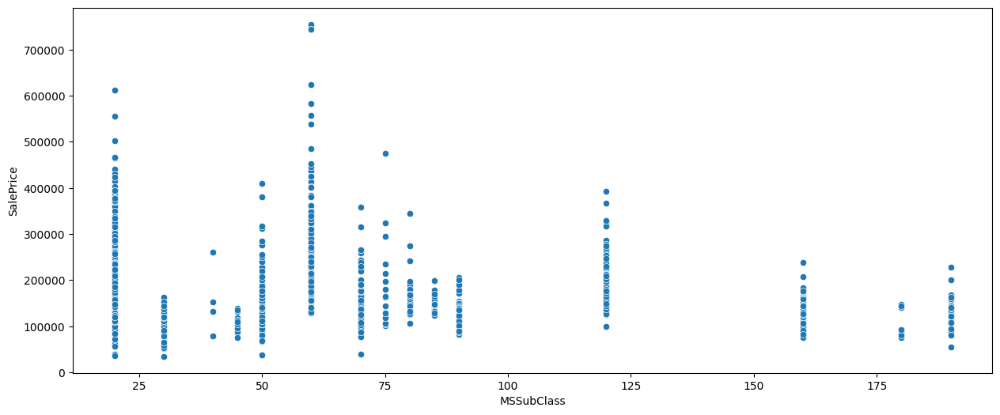

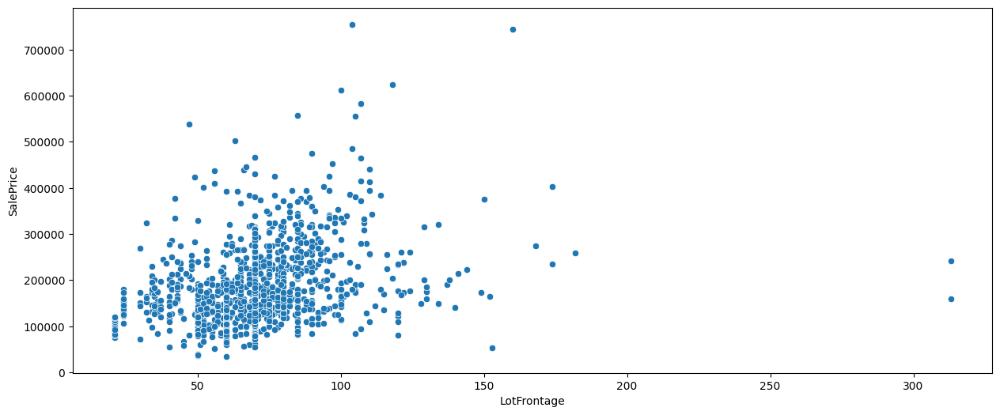

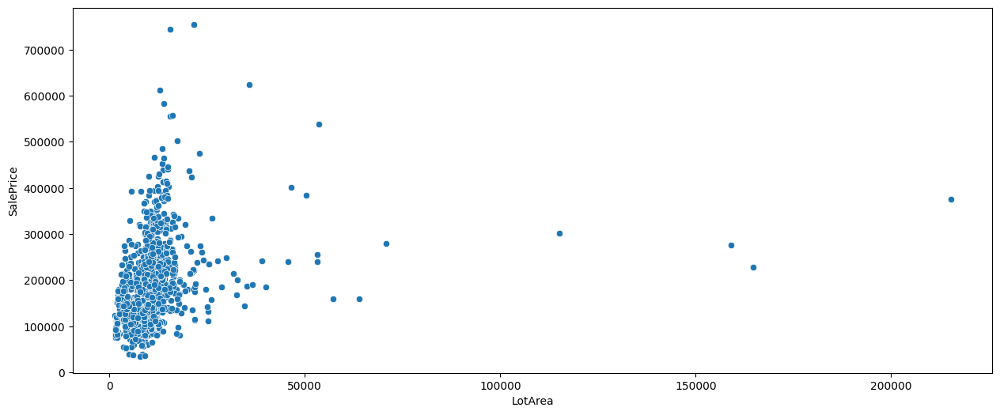

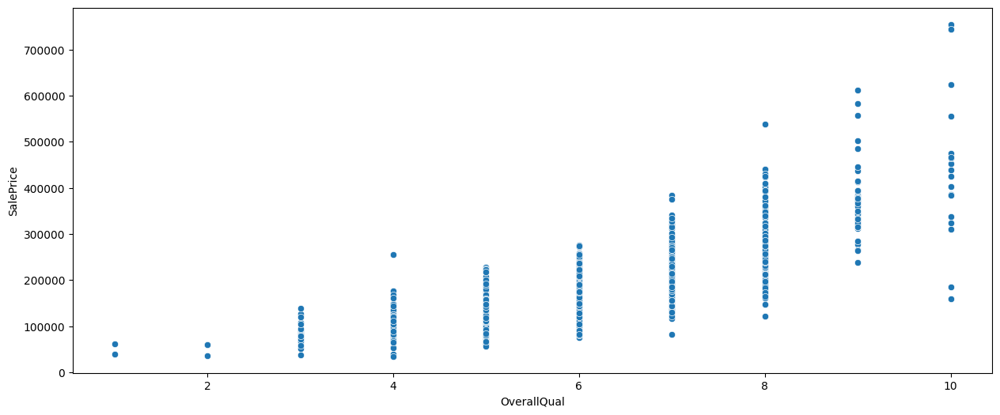

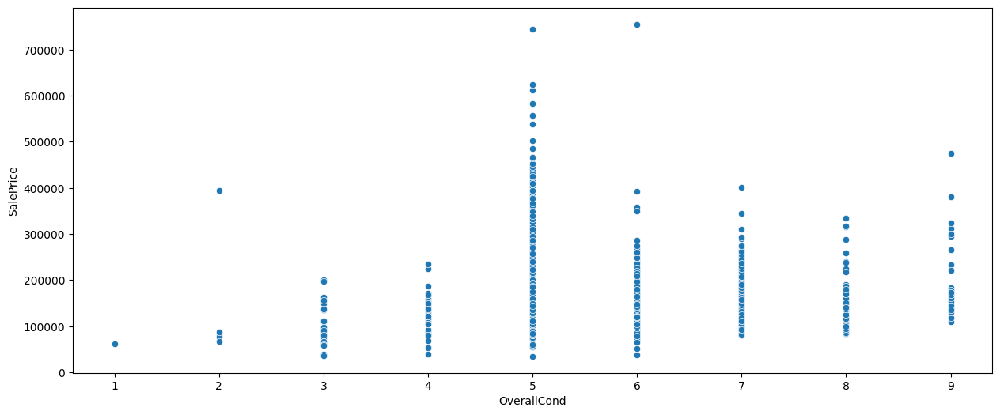

...

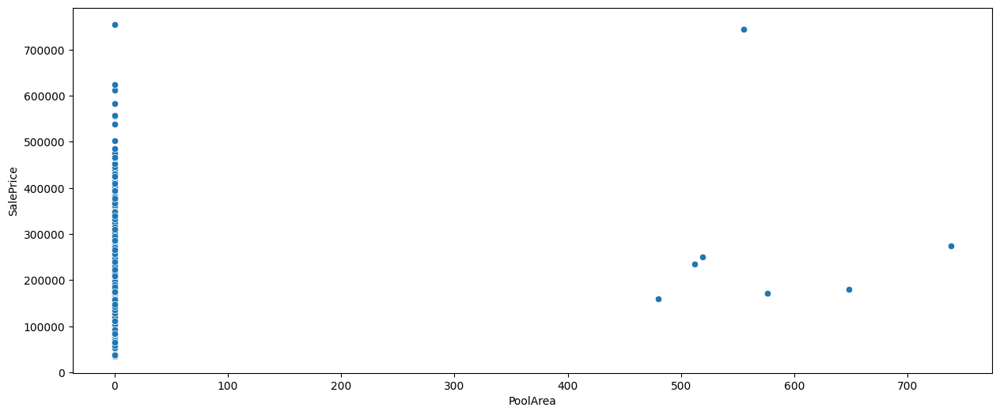

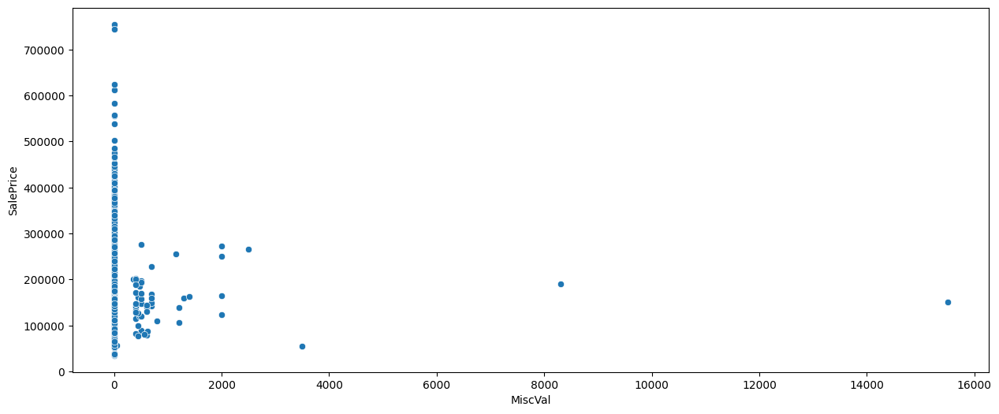

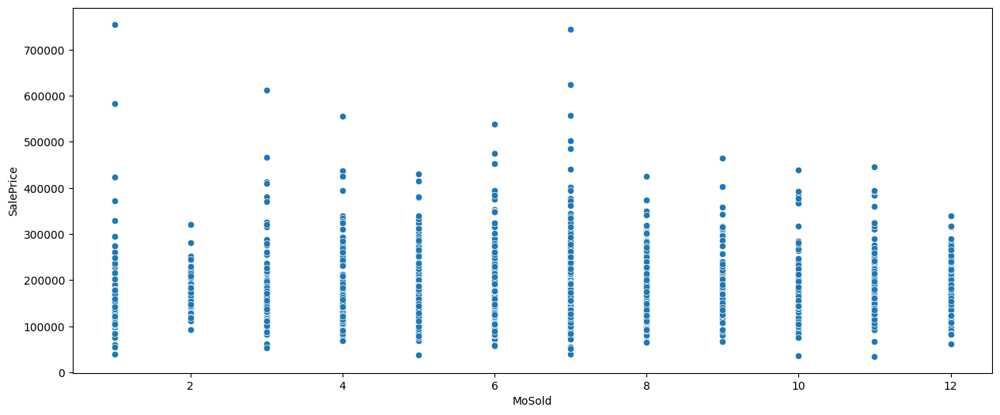

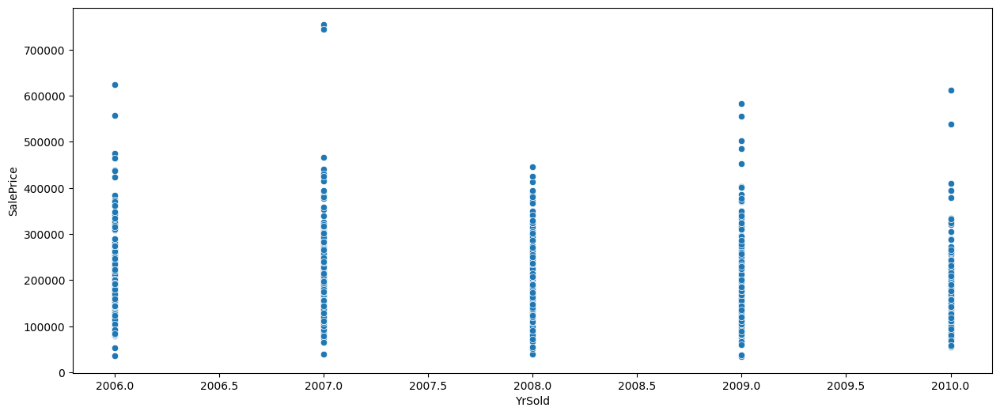

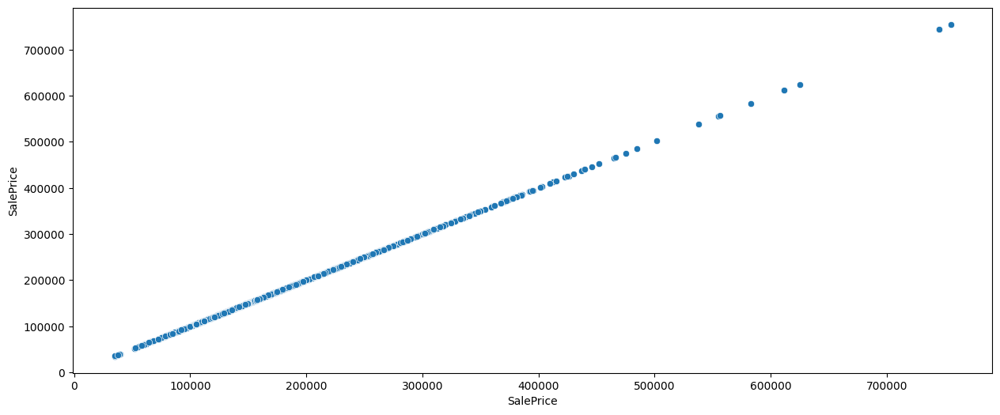

In [ ]:
for i in numeric_col:
  plt.figure(figsize = (15, 6))
  sns.scatterplot(x = df[i], y = df['SalePrice'], data = df, palette = 'hls')
  plt.show()

In [ ]:
corr= df.corr()
corr

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.011156,-0.009601,-0.033226,-0.028365,0.012609,-0.012713,-0.021998,-0.050199,-0.005024,...,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.006242,0.021172,0.000712,-0.021917
MSSubClass,0.011156,1.000000,-0.357056,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022895,-0.069836,...,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.009601,-0.357056,1.000000,0.306795,0.234196,-0.052820,0.117598,0.082746,0.179283,0.215828,...,0.077106,0.137454,0.009790,0.062335,0.037684,0.180868,0.001168,0.010158,0.006768,0.334901
LotArea,-0.033226,-0.139781,0.306795,1.000000,0.105806,-0.005636,0.014228,0.013788,0.103960,0.214103,...,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,-0.028365,0.032628,0.234196,0.105806,1.000000,-0.091932,0.572323,0.550684,0.410238,0.239666,...,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,0.012609,-0.059316,-0.052820,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.127788,-0.046231,...,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,-0.012713,0.027850,0.117598,0.014228,0.572323,-0.375983,1.000000,0.592855,0.314745,0.249503,...,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,-0.021998,0.040581,0.082746,0.013788,0.550684,0.073741,0.592855,1.000000,0.179186,0.128451,...,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,-0.050199,0.022895,0.179283,0.103960,0.410238,-0.127788,0.314745,0.179186,1.000000,0.263582,...,0.159349,0.124965,-0.109849,0.018795,0.061453,0.011723,-0.029815,-0.005940,-0.008184,0.475241
BsmtFinSF1,-0.005024,-0.069836,0.215828,0.214103,0.239666,-0.046231,0.249503,0.128451,0.263582,1.000000,...,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420


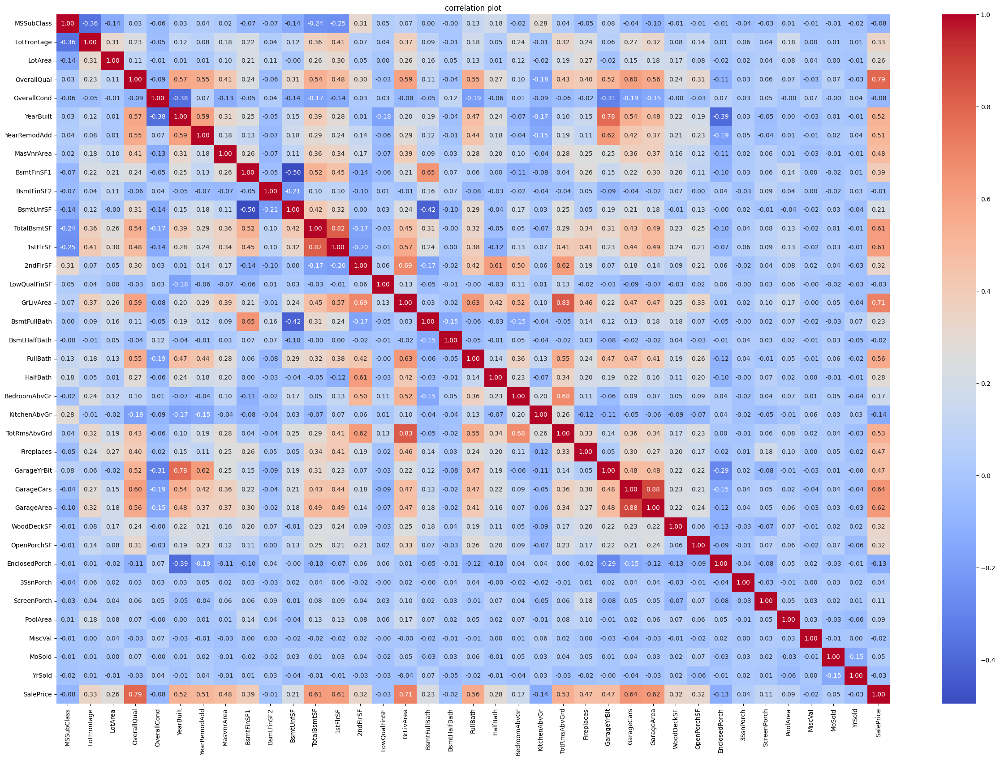

In [ ]:
#heatmap
plt.figure(figsize = (30, 20))
sns.heatmap(corr, annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.title('correlation plot')
plt.show()

In [ ]:
df1 = df.copy()
#reason : don't want to impact the original dataframe

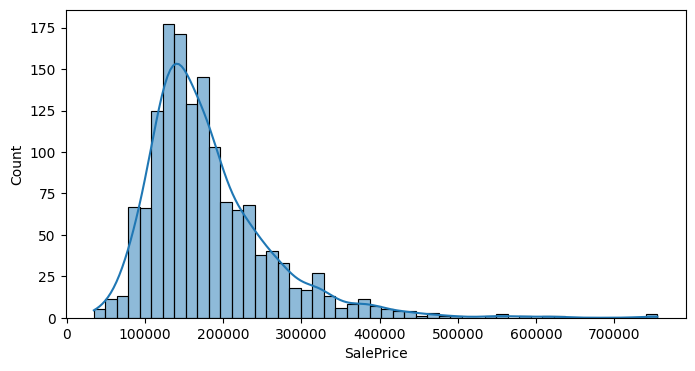

In [ ]:
plt.figure(figsize = (8, 4))
sns.histplot(df1['SalePrice'], kde = True, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [ ]:
df1['SalePrice'] = np.log(df1['SalePrice'])
#to convert into normal distribution we can apply log  on the target variable . it is madatory to be in noraml distribution before performing linear regression

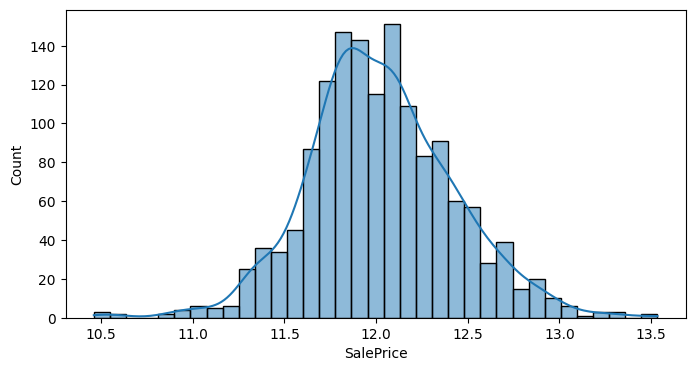

In [ ]:
plt.figure(figsize = (8, 4))
sns.histplot(df1['SalePrice'], kde = True, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [ ]:
numeric_col

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SalePrice']

In [ ]:
numeric_col = ['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold']

In [ ]:
#left or right oriented distribution
skewness = df1[numeric_col].skew()
skewed_col = skewness[(skewness > 1) | (skewness < -1)] #these need to be transformed
print(skewed_col)

MSSubClass        1.407657
LotFrontage       2.384950
LotArea          12.207688
MasVnrArea        2.676412
BsmtFinSF1        1.685503
BsmtFinSF2        4.255261
TotalBsmtSF       1.524255
1stFlrSF          1.376757
LowQualFinSF      9.011341
GrLivArea         1.366560
BsmtHalfBath      4.103403
KitchenAbvGr      4.488397
WoodDeckSF        1.541376
OpenPorchSF       2.364342
EnclosedPorch     3.089872
3SsnPorch        10.304342
ScreenPorch       4.122214
PoolArea         14.828374
MiscVal          24.476794
dtype: float64


In [ ]:
skewed_feature = skewed_col.index.tolist()
print(skewed_feature)

['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'TotalBsmtSF', '1stFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtHalfBath', 'KitchenAbvGr', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']


In [ ]:
#by this the transformation done and the skewness is reduced
for feature in skewed_feature:
  df1[feature] = np.log1p(df1[feature])
  #if we use only log then it will also consider the log 0 which id infinite so log1p is used

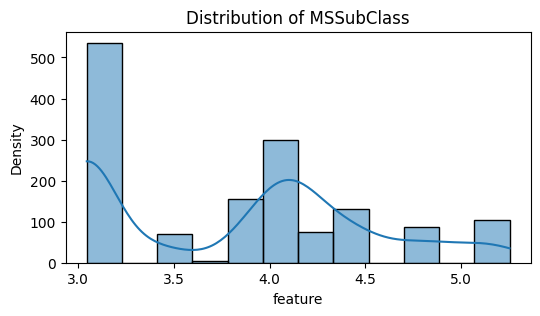

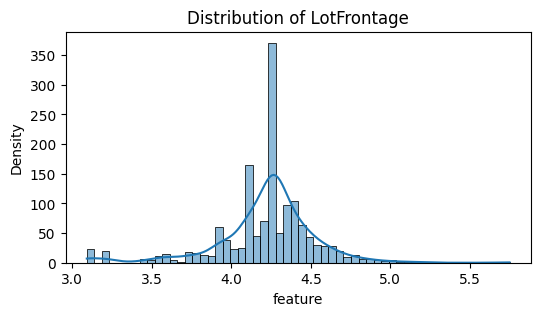

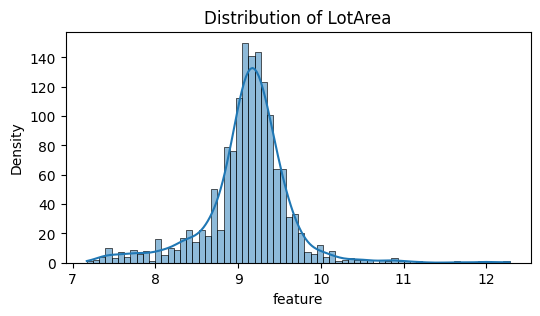

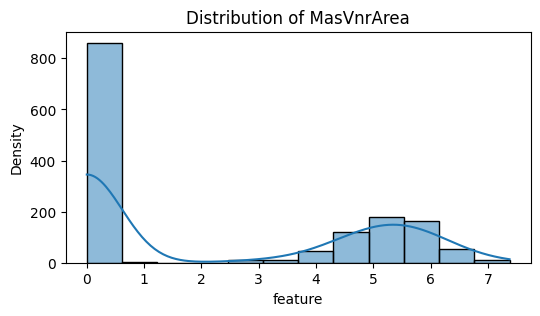

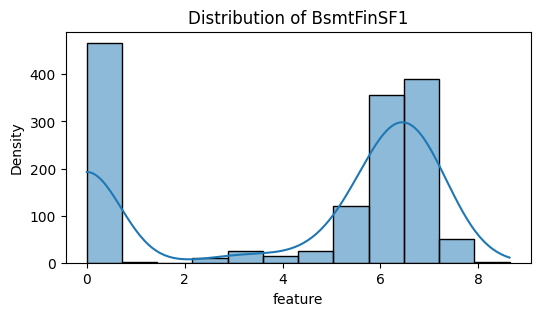

...

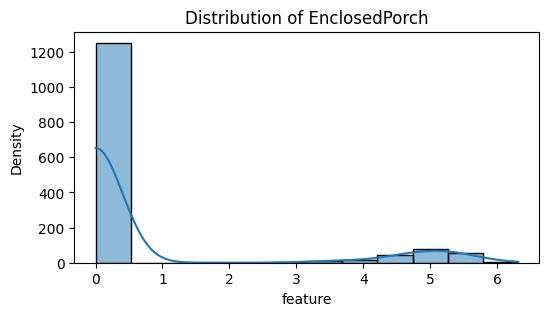

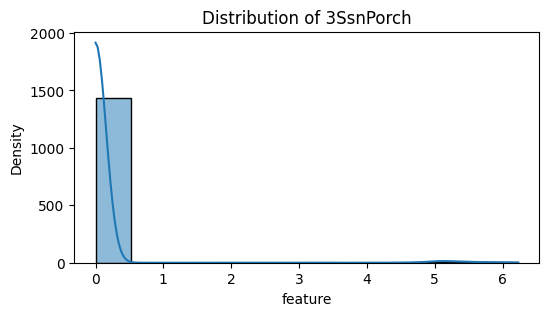

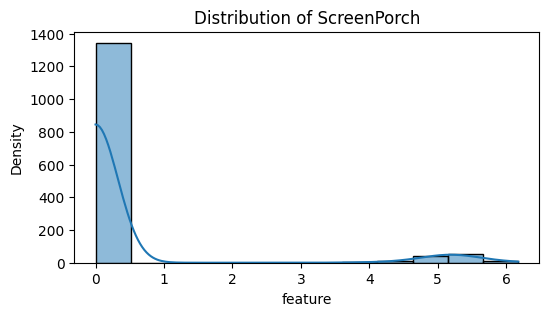

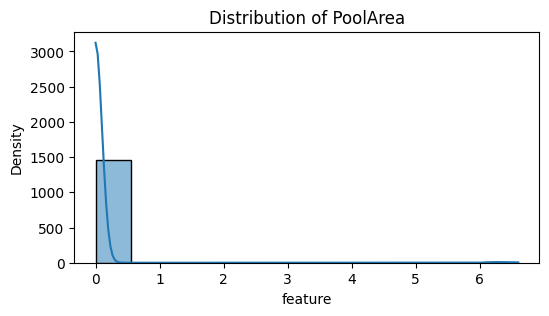

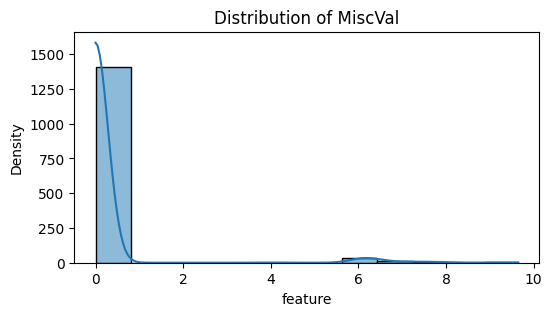

In [ ]:
for feature in skewed_feature:
  plt.figure(figsize = (6, 3))
  sns.histplot(df1[feature], kde = True, palette = 'hls')
  plt.title(f'Distribution of {feature}')
  plt.xlabel('feature')
  plt.ylabel('Density')
  plt.xticks(rotation = 0)
  plt.show()

In [ ]:
df1 = pd.get_dummies(df1, columns = object_col, drop_first = True)
#drop first : drop the object col and include newly created dummies

In [ ]:
corr1= df1.corr()
corr1

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.014453,-0.016916,-0.017483,-0.028365,0.012609,-0.012713,-0.021998,-0.029006,-0.012806,...,-0.048039,0.006396,-0.005415,-0.039543,0.004489,0.055796,-0.038611,0.021172,0.000712,-0.017942
MSSubClass,0.014453,1.000000,-0.391599,-0.378062,0.078346,-0.039820,-0.002896,0.039769,0.012175,-0.092035,...,0.040092,0.028998,0.013820,-0.035954,-0.019569,0.025239,-0.028008,0.010286,-0.027520,-0.020279
LotFrontage,-0.016916,-0.391599,1.000000,0.654004,0.204399,-0.031393,0.088381,0.058630,0.118959,0.069293,...,0.060838,0.133768,-0.021832,0.056688,0.044893,0.119376,0.029565,0.019564,0.004808,0.346668
LotArea,-0.017483,-0.378062,0.654004,1.000000,0.178220,-0.006308,0.021943,0.027672,0.071824,0.096966,...,0.122915,0.137754,-0.015186,0.055375,0.087518,0.097257,0.080298,0.010518,-0.027164,0.399923
OverallQual,-0.028365,0.078346,0.204399,0.178220,1.000000,-0.091932,0.572323,0.550684,0.417093,0.054199,...,0.283256,0.445101,-0.158648,0.027546,0.049983,0.072651,-0.085131,0.070815,-0.027347,0.817184
OverallCond,0.012609,-0.039820,-0.031393,-0.006308,-0.091932,1.000000,-0.375983,0.073741,-0.160299,0.045200,...,-0.039085,-0.100783,0.092471,0.038835,0.061548,-0.008085,0.079251,-0.003511,0.043950,-0.036868
YearBuilt,-0.012713,-0.002896,0.088381,0.021943,0.572323,-0.375983,1.000000,0.592855,0.416160,0.151209,...,0.307474,0.389065,-0.446694,0.028977,-0.059629,0.005805,-0.077819,0.012398,-0.013618,0.586570
YearRemodAdd,-0.021998,0.039769,0.058630,0.027672,0.550684,0.073741,0.592855,1.000000,0.228187,0.012105,...,0.285773,0.382743,-0.226996,0.052398,-0.039983,0.009025,-0.074574,0.021490,0.035743,0.565608
MasVnrArea,-0.029006,0.012175,0.118959,0.071824,0.417093,-0.160299,0.416160,0.228187,1.000000,0.188221,...,0.158972,0.212233,-0.185745,0.046260,0.035794,0.004985,-0.055319,0.020489,-0.001852,0.420330
BsmtFinSF1,-0.012806,-0.092035,0.069293,0.096966,0.054199,0.045200,0.151209,0.012105,0.188221,1.000000,...,0.082144,0.015075,-0.127733,0.051775,0.073392,0.042147,0.018808,-0.027153,0.033702,0.208099


In [ ]:
correlation_threshold = 0.5

In [ ]:
good_features = corr1[corr1['SalePrice'].abs() > correlation_threshold]['SalePrice'].index.tolist()
#prepare a list with index threshold more than 0.5

In [ ]:
good_features.append('SalePrice')

In [ ]:
good_features

['OverallQual',
 'YearBuilt',
 'YearRemodAdd',
 '1stFlrSF',
 'GrLivArea',
 'FullBath',
 'TotRmsAbvGrd',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'SalePrice',
 'ExterQual_Gd',
 'ExterQual_TA',
 'Foundation_PConc',
 'BsmtQual_TA',
 'KitchenQual_TA',
 'GarageFinish_Unf',
 'SalePrice']

In [ ]:
#creating a data frame for all rows in the good_feature
df3 = df1[good_features]
print(df3)

      OverallQual  YearBuilt  YearRemodAdd  1stFlrSF  GrLivArea  FullBath  \
0               7       2003          2003  6.753438   7.444833         2   
1               6       1976          1976  7.141245   7.141245         2   
2               7       2001          2002  6.825460   7.488294         2   
3               7       1915          1970  6.869014   7.448916         1   
4               8       2000          2000  7.044033   7.695758         2   
...           ...        ...           ...       ...        ...       ...   
1455            6       1999          2000  6.860664   7.407318         2   
1456            6       1978          1988  7.637234   7.637234         2   
1457            7       1941          2006  7.080868   7.758333         2   
1458            5       1950          1996  6.983790   6.983790         1   
1459            5       1965          1965  7.136483   7.136483         1   

      TotRmsAbvGrd  GarageYrBlt  GarageCars  GarageArea  SalePrice  
0     

In [ ]:
x = df3.drop(['SalePrice'], axis = 1)
y = df3['SalePrice']

In [ ]:
#traing and testing model
#train then fit in model next test and check accuracy
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

In [ ]:
from sklearn.linear_model import LinearRegression
regression_model = LinearRegression()

In [ ]:
regression_model.fit(x_train, y_train)

LinearRegression()

In [ ]:
y_pred = regression_model.predict(x_test)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_linear = r2_score(y_test, y_pred)
print("Mean Square Error(Mse) : ", mse)
print("Root Mean Squared error(rmse) : ", rmse)
print("r - squared score : ", r2_linear)

Mean Square Error(Mse) :  0.02936820230763084
Root Mean Squared error(rmse) :  0.17137153295582916
r - squared score :  0.8426255365454366


#0.8... is a good score